# Documentation
**Author:** Spencer Ressel

**Created:** August 16th, 2024

***

This notebook analyzes aqua-planet simulation data from the CAM6 model run by Mu-Ting Chien. 
Specifically, MJO diagnostics are computed following the specifications listed by the CLIVAR Madden-Julian Oscillation Working Group (MJOWG).
For details, see https://atmos.uw.edu/~daehyun/mjo_diagnostics/

***

# Imports

In [1]:
%load_ext autoreload
%autoreload 2

print("Loading imports...")
# Aquaplanet analysis config file
from config import *

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# File management
import glob
import os
import sys
from datetime import datetime, timedelta
import copy
import cftime

# Data anaylsis
import numpy as np
import scipy
import xarray as xr
xr.set_options(keep_attrs=True)
import scipy.signal as signal
from scipy.stats import t

# Plotting
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from matplotlib import ticker as mticker
from matplotlib.gridspec import GridSpec
from cartopy import util as cutil
from plotting_functions import *

# Auxiliary functions
from load_aquaplanet_data import *
from processing_functions import *
from auxiliary_functions.modified_colormap import modified_colormap
from auxiliary_functions.bmh_colors import bmh_colors
from auxiliary_functions.one_two_one_filter import one_two_one_filter
from auxiliary_functions.tick_labeller import tick_labeller

print("Imports loaded")

Loading imports...
Imports loaded


# Specify analysis parameters

In [7]:
# Set latitude bounds
LATITUDE_SOUTH = -30
LATITUDE_NORTH = 30
latitude_subset_bounds = slice(LATITUDE_SOUTH, LATITUDE_NORTH)

# Set central longitude
CENTRAL_LONGITUDE = 0

# Set longitude bounds
LONGITUDE_MIN = 0
LONGITUDE_MAX = 360

# Set time bounds
missing_days = [
    cftime.DatetimeNoLeap(7, 2, 5, 0, 0, 0, 0, has_year_zero=True),
    cftime.DatetimeNoLeap(7, 2, 6, 0, 0, 0, 0, has_year_zero=True),
    cftime.DatetimeNoLeap(7, 2, 7, 0, 0, 0, 0, has_year_zero=True),
]

START_TIME = cftime.DatetimeNoLeap(3, 1, 3, 0, 0, 0, 0, has_year_zero=True)
END_TIME = cftime.DatetimeNoLeap(13, 1, 3, 0, 0, 0, 0, has_year_zero=True)
first_half_subset_bounds = slice(START_TIME, missing_days[0] - timedelta(days=1))
second_half_subset_bounds = slice(missing_days[-1] + timedelta(days=1), END_TIME)

# Cut-off periods for intraseasonal filtering
INTRASEASONAL_LOWCUT = 100
INTRASEASONAL_HIGHCUT = 20
frequency_subset_bounds = slice(INTRASEASONAL_LOWCUT, INTRASEASONAL_HIGHCUT)

# Cut-off wavenumbers for MJO-filtering
LARGE_SCALE_CUTOFF = 1
SMALL_SCALE_CUTOFF = 3
wavenumber_bounds = slice(LARGE_SCALE_CUTOFF, SMALL_SCALE_CUTOFF)

# Column-integrated bounds
LOWER_LEVEL_PRESSURE = 950
UPPER_LEVEL_PRESSURE = 100
pressure_subset_bounds = slice(UPPER_LEVEL_PRESSURE, LOWER_LEVEL_PRESSURE)

# Load data

In [8]:
reload_variables = False

# experiment_to_load = '4K'
variables_to_load = [
    "Precipitation",
    # "Outgoing Longwave Radiation",
    "Zonal Wind",
    "Meridional Wind",
    "Vertical Wind",
    "Temperature",
    "Moisture",
    # "Relative Humidity",
    # "Geopotential Height",
    # "Longwave Heating Rate",
    # "Shortwave Heating Rate",
    # "Latent Heat Flux",
    # "Sensible Heat Flux",
    # "Surface Pressure",
    # "Moist Static Energy",
    # "Column Moist Static Energy",
    # "Column Water Vapor",
    # "Column Temperature",
    # "Column Longwave Heating",
    # "Column Shortwave Heating"
    "Potential Temperature",
    # "Saturation Specific Humidity"
    # "Column Relative Humidity",
    # "Diabatic Heating"
]

# if reload_variables or 'variables_dict' not in globals():
#     variables_dict = load_aquaplanet_data(variables_to_load, experiment_to_load)
# else:
#     new_variables_dict = load_aquaplanet_data(variables_to_load, experiment_to_load)

#     # If not reloading, append new variables to existing dict
#     for variable_name, variable_data in new_variables_dict.items():
#         if variable_name not in variables_dict.keys():
#             print(f"Adding {variable_name} to Active Variables...", end="")
#             variables_dict[variable_name] = variable_data
#             print(rf"{'✔':>1}")

# print('=' * str_width)
# print(f"\nActive Variables:")
# print("\n".join([key for key in variables_dict.keys()]))

# Load pre-processed data

## Subset data

In [9]:
if not 'multi_experiment_variables_subset' in locals():
    multi_experiment_variables_subset = load_multi_experiment_processed_data(
        variables_to_load,
        'subset'
    )
else:
    multi_experiment_variables_subset = load_multi_experiment_processed_data(
        variables_to_load,
        'subset',
        multi_experiment_variables_subset,
        False
    )

          Loading subset data           
(1/7) Precipitation...                  
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(2/7) Zonal Wind...                     
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(3/7) Meridional Wind...                
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(4/7) Vertical Wind...                  
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                

# EOF analysis

## Full horizontal fields

### Calculate EOFs

In [ ]:
output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
savefig = False
calculate_eofs = True
plot_eofs = True

compositing_variable = multi_experiment_variables_filtered['Precipitation'].copy(deep=True)
# compositing_variable = multi_experiment_variables_subset['Diabatic Heating'].copy(deep=True)
EOF = xr.DataArray(
    data = np.empty((len(experiments_list), len(time), len(latitude), len(longitude))),
    dims=["experiment", "index", "lat", "lon"],
    coords=dict(
        experiment=experiments_list,
        index=np.arange(1, len(time)+1),
        lat=latitude,
        lon=longitude
    )
)

PC = xr.DataArray(
    data = np.empty((len(experiments_list), len(time), len(time))),
    dims=["experiment", "index", "time"],
    coords=dict(
        experiment=experiments_list,
        index=np.arange(1, len(time)+1),
        time=time
    )
)

eigenvalue_spectrum = xr.DataArray(
    data = np.empty((len(experiments_list), len(time))),
    dims=["experiment", "index"],
    coords=dict(
        experiment=experiments_list,
        index=np.arange(1, len(time)+1),
    )
)

spectrum_error = xr.DataArray(
    data = np.empty((len(experiments_list), len(time))),
    dims=["experiment", "index"],
    coords=dict(
        experiment=experiments_list,
        index=np.arange(1, len(time)+1),
    )
)

print(f"Variable: {compositing_variable.name}")

if calculate_eofs:
    for experiment_index, experiment in enumerate(experiments_list):
        print(f"{'='*40}")
        print(f"Experiment: {experiment}")
        print(f"{'='*40}")
        print("Reshaping variables...")
        reshaped_variable = np.reshape(
            compositing_variable.sel(experiment=experiment).values,
            (
                len(compositing_variable.time),
                (
                    len(compositing_variable.lat)
                    * len(compositing_variable.lon)
                ),
            ),
        )
        print("Variables reshaped")

        #### Calculate EOFs and PCs
        print("Computing EOFs...")
        U, S, VT = np.linalg.svd(reshaped_variable.T, full_matrices=False)
        EOF[experiment_index] = np.reshape(
                    U.T,
                    (
                        len(compositing_variable.time),
                        len(compositing_variable.lat),
                        len(compositing_variable.lon),
                    ),
                )
        PC[experiment_index] = np.dot(np.diag(S), VT)
        print("EOFs computed")

        # Calculate nominal degrees of freedom
        nominal_degrees_of_freedom = np.size(reshaped_variable, 1)

        # Calculate eigenvalues and spectrum
        eigenvalues = S**2 / nominal_degrees_of_freedom
        eigenvalue_spectrum[experiment_index] = eigenvalues / np.sum(eigenvalues)
        explained_variance = 100 * eigenvalue_spectrum[experiment_index]

        # Estimate 1-lag autocorrelation and effective degrees of freedom
        lag = 1
        B = 0
        for k in range(lag - 1, nominal_degrees_of_freedom - lag):
            B = B + np.sum(reshaped_variable[:, k] * reshaped_variable[:, k + lag])
        phi_L = 1 / (nominal_degrees_of_freedom - 2 * lag) * B
        phi_0 = 1 / nominal_degrees_of_freedom * np.sum(reshaped_variable**2)
        autocorrelation = phi_L / phi_0
        degrees_of_freedom = (
            (1 - autocorrelation**2) / (1 + autocorrelation**2)
        ) * nominal_degrees_of_freedom

        # Estimate uncertainty in eigenvalue spectrum
        spectrum_error[experiment_index] = (
            eigenvalue_spectrum[experiment_index]
            * np.sqrt(2 / degrees_of_freedom)
        )

else:
    print("Using pre-calculated EOFs")

print(f"{'='*40}")
print("Finished")

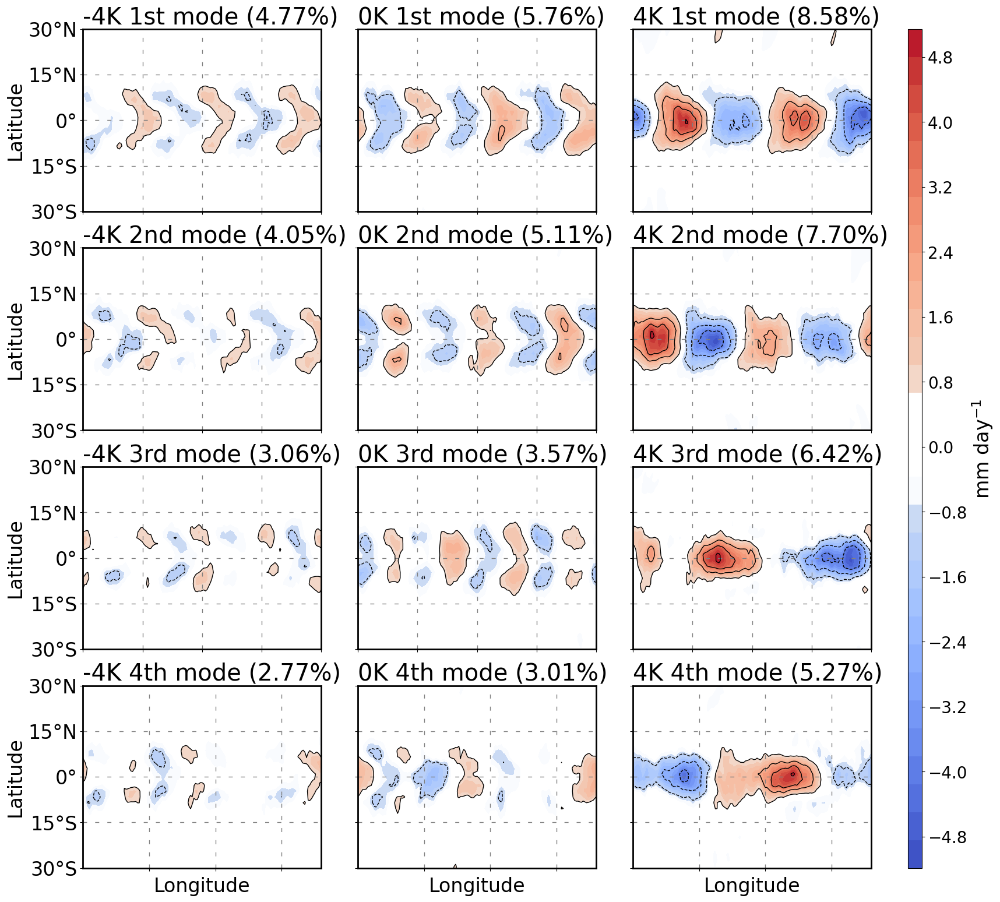

In [72]:
plt.style.use("default")
plt.rcParams.update({"font.size": 24})
cmap_modified = mjo.modified_colormap("coolwarm", "white", 0.1, 0.1)

fig = plt.figure(figsize=(16, 16))
gs = GridSpec(4, 4, width_ratios=[1, 1, 1, 0.06], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.2, wspace=0.2)

# fig.suptitle(f"EOFs 1-4 of {experiment} "
#              + f"{((str(compositing_variable.plev.values) + '-hPa ') if 'plev' in compositing_variable.coords else '')}"
#              +f"{compositing_variable.name}", x=0.5, y=0.975, ha='center')

axes = {}
for experiment_index, experiment in enumerate(experiments_list):
    axes[experiment_index] = []
    axes[experiment_index].append(fig.add_subplot(gs[0, experiment_index]))
    axes[experiment_index].append(fig.add_subplot(gs[1, experiment_index]))
    axes[experiment_index].append(fig.add_subplot(gs[2, experiment_index]))
    axes[experiment_index].append(fig.add_subplot(gs[3, experiment_index]))

cb_ax = fig.add_subplot(gs[0:4, -1])

nth = {1: "1st", 2: "2nd", 3: "3rd", 4: "4th"}

fig_labels = {1: "a)", 2: "b)", 3: "c)", 4: "d)"}

mult = [1, 1, 1, 1]

grand_max = 1e-10
grand_min = 1e10

for experiment_index, experiment in enumerate(experiments_list):
    for index, ax in enumerate(axes[experiment_index]):
        grand_max = max(
            np.max(np.std(PC.sel(experiment=experiment, index=index+1))*EOF.sel(experiment=experiment, index=index+1)),
            grand_max
        )
        grand_min = min(
            np.min(np.std(PC.sel(experiment=experiment, index=index+1))*EOF.sel(experiment=experiment, index=index+1)),
            grand_min
        )

# {fig_labels[index+1]}

for experiment_index, experiment in enumerate(experiments_list):
    for index, ax in enumerate(axes[experiment_index]):
        ax.set_title(
            f"{experiment} {nth[index+1]}"
            + f" mode ({100*eigenvalue_spectrum.sel(experiment=experiment, index=index+1):0.2f}%)",
            loc="left",
        )

        # Add cyclic point
        cdata, clon = cutil.add_cyclic_point(
            np.std(PC.sel(experiment=experiment, index=index+1))
            * EOF.sel(experiment=experiment, index=index+1),
            coord=compositing_variable.lon,
        )

        # Plot data
        im = ax.contourf(
            clon,
            compositing_variable.lat,
            cdata,
            cmap=cmap_modified,
            levels=np.linspace(grand_min, grand_max, 31),
            norm=mcolors.CenteredNorm(vcenter=0),
            # extend='both'
        )

        # Plot data
        ax.contour(
            clon,
            compositing_variable.lat,
            cdata,
            colors="k",
            levels=im.levels[np.abs(im.levels) >= np.quantile(np.abs(im.levels), 0.01)][::4],
            linewidths=1,
        )

    # for ax in axes:
        ax.set_aspect("auto")
        ax.grid(True, **grid_kwargs)

        ax.set_xlim(0, 360)
        x_ticks = np.arange(0, 360 + 90, 90)
        ax.set_xticks(x_ticks)
        if index == 3:
            ax.set_xticklabels(tick_labeller(x_ticks-180, "lon"))
            ax.xaxis.set_major_locator(mticker.MaxNLocator(4, prune="lower"))
            ax.set_xlabel("Longitude")
        else:
            ax.set_xticklabels('')

        ax.set_ylim(-30, 30)
        ax.set_yticks(np.arange(-30, 45, 15))
        if experiment_index == 0:
            ax.set_yticklabels(tick_labeller(np.arange(-30, 45, 15), 'lat'))
            ax.set_ylabel("Latitude")
        else:
            ax.set_yticklabels('')

        for spine in ax.spines.values():
            spine.set_edgecolor("black")
            spine.set_linewidth(2)

# Add colorbar
cbar = fig.colorbar(im, cax=cb_ax)
cbar.ax.tick_params(labelsize=20)
cbar.locator = mticker.MaxNLocator(nbins=15)
cbar.set_label(f"{compositing_variable.attrs['units']}")

if not savefig:
    plt.show()
else:
    save_string = (
        f"{experiment}"
      + f"_{compositing_variable.attrs['file_id']}"
      + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}_EOF-maps.png"
        )
    print(f"Saving plot as {save_string}")
    plt.savefig(
        f"{output_directory}/EOFs/single-variable-latitude-longitude/{save_string}",
        dpi=500,
        bbox_inches="tight",
    )

### Eigenvalue Spectra

Variable: Precipitation


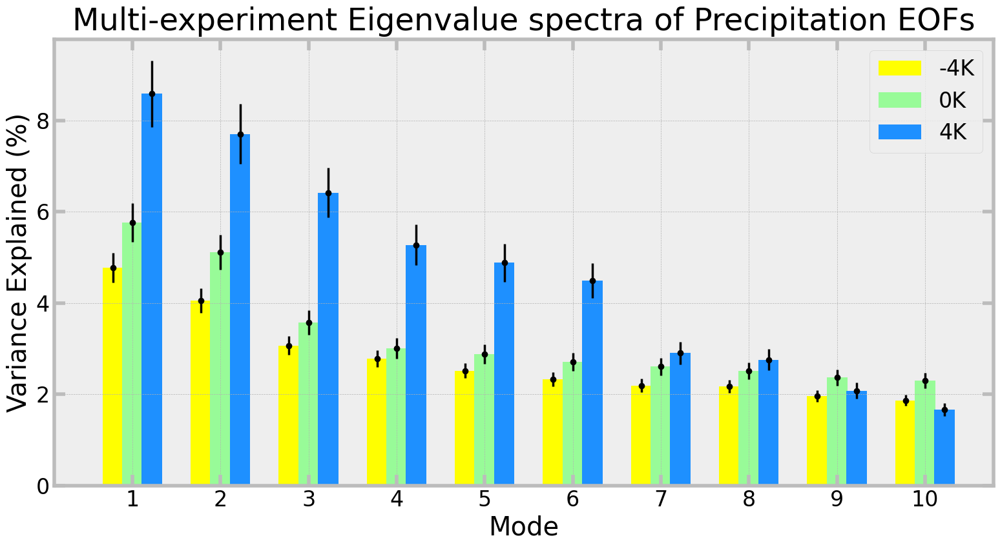

Finished


In [73]:
output_directory = "/glade/u/home/sressel/aquaplanet_analysis/output/"
savefig = False

print(f"Variable: {compositing_variable.name}")

plt.style.use("bmh")
plt.rcParams.update({"font.size": 24})

[fig, ax] = plt.subplots(figsize=(16, 9))
num_modes = 10
jump = 1.5
EOF_index = np.arange(1, 1 + (num_modes*jump), jump)

ax.set_title(
    f"Multi-experiment Eigenvalue spectra of "
  + f"{((str(compositing_variable.plev.values) + '-hPa ') if 'plev' in compositing_variable.coords else '')}"
  + f"{compositing_variable.name} EOFs",
    pad=10
)

for experiment_index, experiment in enumerate(experiments_list):
    ax.bar(
        EOF_index+experiment_index/3,
        100 * eigenvalue_spectrum.sel(experiment=experiment)[:num_modes],
        width=0.35,
        color=["yellow", "palegreen", "dodgerblue"][experiment_index],
        label=experiment
    )

    ax.errorbar(
        EOF_index+experiment_index/3,
        100 * eigenvalue_spectrum.sel(experiment=experiment)[:num_modes],
        100 * spectrum_error.sel(experiment=experiment)[:num_modes],
        fmt="o",
        lw=2.5,
        color="black",
    )

ax.set_ylabel("Variance Explained (%)")
ax.set_xlabel("Mode")

# Configure and label axes
for axis in ["top", "bottom", "left", "right"]:
    ax.spines[axis].set_linewidth(4)

ax.tick_params(
    axis="both",
    which="major",
    length=12,
    width=4,
    color="#bcbcbc",
    direction="in",
    right=True,
    top=True,
    pad=5,
)
ax.legend(loc='upper right')

# ax.set_ylim(0, 15)
ax.set_ylim(bottom=0)
ax.set_xlim(0, EOF_index[-1]+jump)
ax.set_xticks(EOF_index+1/3, labels=np.arange(1,len(EOF_index)+1))
# ax.set_yticks(np.arange(0, 17, 2))

plt.tight_layout()

if not savefig:
    plt.show()
else:
    save_string = (
        f"{experiment}"
      + f"_{compositing_variable.attrs['file_id']}"
      + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}_eigenvalue-spectra.png"
        )
    print(f"Saving plot as {save_string}")
    plt.savefig(
        f"{output_directory}/EOFs/single-variable-latitude-longitude/{save_string}",
        dpi=500,
        bbox_inches="tight",
    )

print(f"{'='*40}")
print("Finished")

### PC Power Spectra

In [74]:
output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
savefig = True

print(f"Variable: {compositing_variable.name}")

SEGMENT_LENGTH = 256
OVERLAP = SEGMENT_LENGTH // 2
frequency = {}
spectrum = {}
periods = np.array([100, 60, 30, 20, 15, 10, 5, 3, 2])
frequency_from_period = 1 / periods

for i in range(1, 4):
    (frequency[i], spectrum[i]) = signal.welch(
        (PC.sel(index=i) - PC.sel(index=i).mean(dim='time')),
        fs=1,
        detrend='linear',
        window="hann",
        nperseg=SEGMENT_LENGTH,
        noverlap=OVERLAP,
        axis=1
    )

# # Plot the power spectra
# plt.style.use("bmh")

# [fig, ax] = plt.subplots(figsize=(16, 9))
# ax.set_title(f"Power Spectra of {compositing_variable.attrs['file_id']} Principal Components 1-4", pad=15)
# for i in spectrum:
#     ax.plot(frequency[i], frequency[i] * spectrum[i], label=("PC" + str(i)), lw=4)

# ax.tick_params(
#     which="major", direction="in", color="#bcbcbc", length=8, width=2, pad=15
# )

# ax.tick_params(
#     which="minor", direction="in", color="#bcbcbc", length=4, width=1, pad=15
# )

# # Add vertical lines to show the intraseasonal band
# for period in [100, 20]:
#     ax.axvline(x=1 / period, ls=":", lw=4, color="black", alpha=0.5)

# # Configure axes
# ax.set_xscale("log")
# ax.set_ylabel(rf"[{compositing_variable.attrs['units']}]$^{2}$")
# ax.set_xlabel("Period (days)")
# ax.legend(loc="best")

# for edge in ["top", "bottom", "left", "right"]:
#     ax.spines[edge].set_linewidth(4)

# ax.tick_params(
#     which="major",
#     axis="both",
#     direction="in",
#     top=True,
#     right=True,
#     width=4,
#     length=15,
#     color="#bcbcbc",
#     pad=10,
# )

# # Set tick parameters
# ax.set_xticks(ticks=frequency_from_period)
# ax.xaxis.set_major_formatter(mticker.FixedFormatter(periods))
# ax.set_xlim(1 / 150, 1 / 5)

# plt.tight_layout()

# if not savefig:
#     plt.show()
# else:
#     save_string = (
#         f"{experiment}"
#       + f"_{compositing_variable.attrs['file_id']}"
#       + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}_power-spectra.png"
#         )
#     print(f"Saving plot as {save_string}")
#     plt.savefig(
#         f"{output_directory}/EOFs/single-variable-latitude-longitude/{save_string}",
#         dpi=500,
#         bbox_inches="tight",
#     )

# print(f"{'='*40}")
# print("Finished")

Variable: Precipitation


## Combined meridional-mean EOFs

### Calculate EOFs

In [39]:
near_equatorial_variables = {}

print(f"{'Combined EOF Analysis':^{str_width}}")
print(f"{'='*str_width}")

print("Meridionally averaging...")
for variable in variables_filtered:
    near_equatorial_variables[variable] = (
        variables_filtered[variable].sel(lat=slice(-15, 15)).mean(dim="lat")
    )
    near_equatorial_variables[variable] /= np.sqrt(
        near_equatorial_variables["precipitation"].var(dim="time").mean(dim="lon")
    )

print("Combining data...")
combined_data = np.concatenate(
    [
        near_equatorial_variables["outgoing longwave radiation"],
        near_equatorial_variables["zonal wind"].sel(plev=200),
        near_equatorial_variables["zonal wind"].sel(plev=850),
    ],
    axis=1,
)

#### Calculate EOFs and PCs
print("Computing EOFs...")
U_combined, S_combined, VT_combined = np.linalg.svd(combined_data.T, full_matrices=False)
EOF_combined = U_combined.T
PC_combined = np.dot(np.diag(S_combined), VT_combined)

# Calculate nominal degrees of freedom
nominal_degrees_of_freedom_combined = np.size(combined_data, 1)

# Calculate eigenvalues and spectrum
eigenvalues_combined = S_combined**2 / nominal_degrees_of_freedom_combined
eigenvalue_spectrum_combined = eigenvalues_combined / np.sum(eigenvalues_combined)
explained_variance_combined = 100 * eigenvalue_spectrum_combined

# Estimate 1-lag autocorrelation and effective degrees of freedom
lag = 1
B = 0
for k in range(lag - 1, nominal_degrees_of_freedom_combined - lag):
    B = B + np.sum(combined_data[:, k] * combined_data[:, k + lag])
phi_L_combined = 1 / (nominal_degrees_of_freedom_combined - 2 * lag) * B
phi_0_combined = 1 / nominal_degrees_of_freedom_combined * np.sum(combined_data**2)
autocorrelation_combined = phi_L_combined / phi_0_combined
degrees_of_freedom_combined = (
    (1 - autocorrelation_combined**2) / (1 + autocorrelation_combined**2)
) * nominal_degrees_of_freedom_combined

# Estimate uncertainty in eigenvalue spectrum
spectrum_error_combined = eigenvalue_spectrum_combined * np.sqrt(2 / degrees_of_freedom_combined)

# Extract the EOFs of each variable from the array
olr_EOF = EOF_combined[:, : len(longitude)]
upper_level_zonal_wind_EOF = EOF_combined[:, len(longitude) : 2 * len(longitude)]
lower_level_zonal_wind_EOF = EOF_combined[:, 2 * len(longitude) :]

print("EOFs computed")

print(f"{'='*str_width}")
print("Finished")

Combined EOF Analysis
Meridionally averaging...
Combining data...
Computing EOFs...
EOFs computed
Finished


### Plot EOF maps

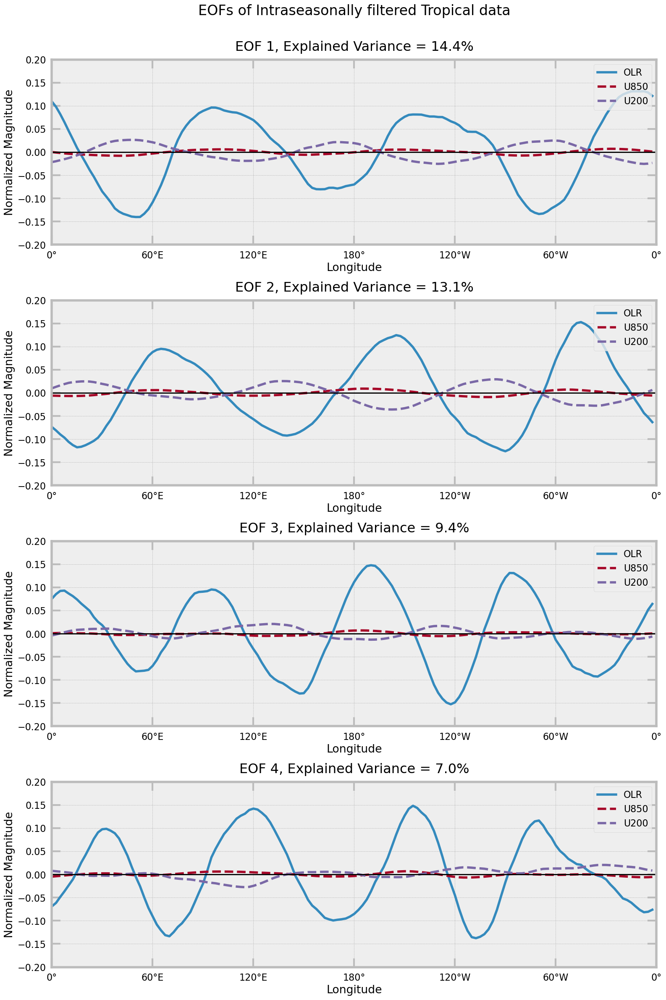

Finished


In [40]:
savefig=False

plt.style.use('bmh')
plt.rcParams.update({"font.size": 16})

n_eofs_to_plot = 4

fig = plt.figure(figsize=(16, 6*n_eofs_to_plot))
gs = GridSpec(n_eofs_to_plot, 1, figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.30)

fig.suptitle("EOFs of Intraseasonally filtered Tropical data", fontsize=24, y=1.005)

ax = []
for row in range(n_eofs_to_plot):
    ax.append(fig.add_subplot(gs[row, 0]))

for row in range(n_eofs_to_plot):

    ax[row].set_title(f"EOF {row+1}, Explained Variance = {explained_variance_combined[row]:0.1f}%", pad=15)
    ax[row].plot(
        longitude,
        -olr_EOF[row],
        lw=4,
        label="OLR"
    )
    ax[row].plot(
        longitude,
        lower_level_zonal_wind_EOF[row],
        ls="--",
        lw=4,
        label="U850"
    )
    ax[row].plot(
        longitude,
        upper_level_zonal_wind_EOF[row],
        ls="--",
        lw=4,
        label="U200"
    )
    ax[row].axhline(y=0, lw=2, color="k")

# Configure axes
for axis in range(n_eofs_to_plot):
    # Set axis labels and limits
    ax[axis].set_xlabel("Longitude")
    ax[axis].set_ylabel("Normalized Magnitude")
    ax[axis].set_xlim(0, 360-2.5)
    ax[axis].set_ylim(-0.2, 0.2)
    ax[axis].set_xticks(
        ticks=np.arange(0, 360+60, 60),
        labels=tick_labeller(np.arange(0, 360+60, 60), 'lon')
    )

    # Specify tick parameters
    ax[axis].tick_params(
        which="major",
        width=3,
        length=15,
        direction="in",
        color='#bcbcbc',
        top=True,
        right=True,
        pad=10
    )

    ax[axis].tick_params(
        which="minor",
        width=3,
        length=7.5,
        direction="in",
        color='#bcbcbc',
        top=True,
        right=True,
        pad=10
    )

    for edge in ['top','bottom','left','right']:
        ax[axis].spines[edge].set_linewidth(4)

    ax[axis].legend(loc="upper right")

if not savefig:
    plt.show()
else:
    save_string = (
        f"{experiment}_combined-variables_EOF-maps.png"
      # + f"_{variable.attrs['file_id']}"
      # + f"{((str(variable.plev.values)) if 'plev' in variable.coords else '')}_EOF-maps.png"
        )
    print(f"Saving plot as {save_string}")
    plt.savefig(
        f"{output_directory}/EOFs/combined-variables/{save_string}",
        dpi=500,
        bbox_inches="tight",
    )

print(f"{'='*40}")
print("Finished")

### Plot eigenvalue spectra

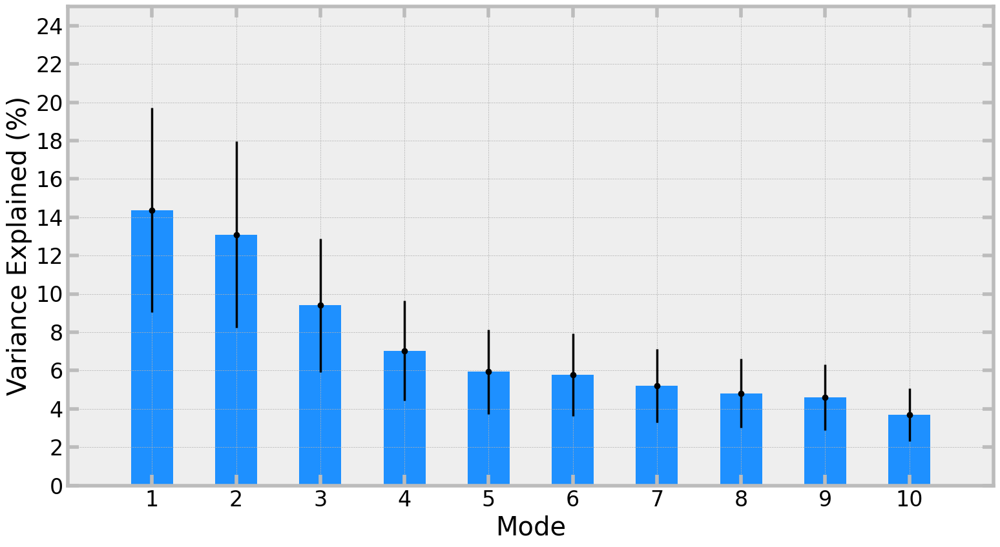

Finished


In [41]:
savefig = False

plt.style.use("bmh")
plt.rcParams.update({"font.size": 24})

[fig, ax] = plt.subplots(figsize=(16, 9))
num_modes = 10
EOF_index = np.arange(1, num_modes + 1, 1)
# ax.set_title(
#     (
#         f"Percentage variance, {data_source[plotting_variable]} {variable_file_id[plotting_variable]}, {season_select.capitalize()}\n"
#         + f"{degrees_of_freedom:0.0f} effective degrees of freedom"
#     ),
#     pad=15
# )

ax.bar(EOF_index, 100 * eigenvalue_spectrum_combined[:num_modes], width=0.5, color="dodgerblue")

ax.errorbar(
    EOF_index,
    100 * eigenvalue_spectrum_combined[:num_modes],
    100 * spectrum_error_combined[:num_modes],
    fmt="o",
    lw=2.5,
    color="black",
)

ax.set_ylabel("Variance Explained (%)")
ax.set_xlabel("Mode")

# Configure and label axes
for axis in ["top", "bottom", "left", "right"]:
    ax.spines[axis].set_linewidth(4)

ax.tick_params(
    axis="both",
    which="major",
    length=12,
    width=4,
    color="#bcbcbc",
    direction="in",
    right=True,
    top=True,
    pad=5,
)

# eof_text = (
#     f'EOF 1: {explained_variance_combined[0]:0.0f}% of variance \n'
#     + f'EOF 2: {explained_variance_combined[1]:0.0f}% of variance '
# )

# # Add text showing percentage of explained variance
# ax.text(
#     9.95, 0.05, eof_text, fontsize=24,
#     bbox=dict(
#         boxstyle='round', facecolor='#eeeeee', edgecolor='#bcbcbc', alpha=0.5
#     ),
#     horizontalalignment='right', verticalalignment='top'
# )

ax.set_ylim(0, 25)
ax.set_xlim(0, 11)
ax.set_xticks(EOF_index)
ax.set_yticks(np.arange(0, 25, 2))

plt.tight_layout()

# if not savefig:
#     plt.show()
# else:
#     plt.savefig(
#         (
#             f"{output_directory}/"
#             + f"{season_select}_{data_source[plotting_variable]}-{variable_file_id[plotting_variable]}_percentage-variance.png"
#         ),
#         dpi=300,
#         bbox_inches="tight",
#     )

if not savefig:
    plt.show()
else:
    save_string = (
        f"{experiment}_combined-variables_eigenvalue-spectra.png"
      # + f"_{variable.attrs['file_id']}"
      # + f"{((str(variable.plev.values)) if 'plev' in variable.coords else '')}_EOF-maps.png"
        )
    print(f"Saving plot as {save_string}")
    plt.savefig(
        f"{output_directory}/EOFs/combined-variables/{save_string}",
        dpi=500,
        bbox_inches="tight",
    )

print(f"{'='*40}")
print("Finished")

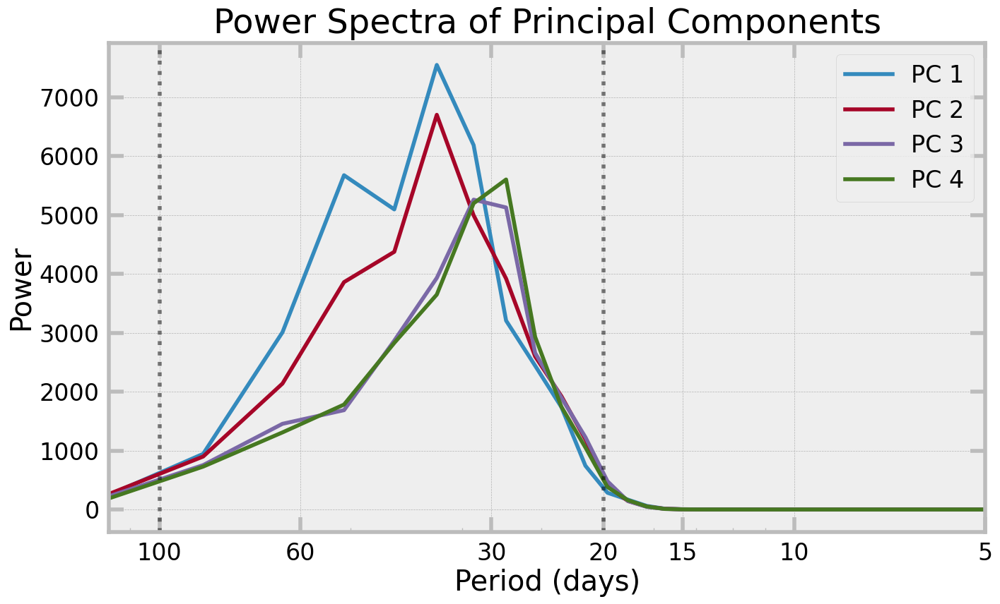

In [115]:
SEGMENT_LENGTH = 256
OVERLAP = SEGMENT_LENGTH // 2
frequency_combined = {}
spectrum_combined = {}
periods = np.array([100, 60, 30, 20, 15, 10, 5, 3, 2])
frequency_from_period = 1 / periods

for i in range(1, 5):
    (frequency_combined[i], spectrum_combined[i]) = signal.welch(
        PC_combined[i - 1] - np.mean(PC_combined[i - 1]),
        fs=1,
        window="hann",
        nperseg=SEGMENT_LENGTH,
        noverlap=OVERLAP,
    )

# Plot the power spectra
plt.style.use("bmh")

[fig, ax] = plt.subplots(figsize=(16, 9))
ax.set_title("Power Spectra of Principal Components", pad=10)
for i in spectrum_combined:
    ax.plot(
        frequency_combined[i],
        frequency_combined[i] * spectrum_combined[i],
        label=f"PC {i}",
        lw=4
    )

ax.tick_params(
    which="major", direction="in", color="#bcbcbc", length=8, width=2, pad=15
)

ax.tick_params(
    which="minor", direction="in", color="#bcbcbc", length=4, width=1, pad=15
)

# Add vertical lines to show the intraseasonal band
for period in [100, 20]:
    ax.axvline(x=1 / period, ls=":", lw=4, color="black", alpha=0.5)

# Configure axes
ax.set_xscale("log")
ax.set_ylabel("Power")
ax.set_xlabel("Period (days)")
ax.legend(loc="best")

for edge in ["top", "bottom", "left", "right"]:
    ax.spines[edge].set_linewidth(4)

ax.tick_params(
    which="major",
    axis="both",
    direction="in",
    top=True,
    right=True,
    width=4,
    length=15,
    color="#bcbcbc",
    pad=10,
)

# Set tick parameters
ax.set_xticks(ticks=frequency_from_period)
ax.xaxis.set_major_formatter(mticker.FixedFormatter(periods))
ax.set_xlim(1/120, 1/5)

plt.show()

# plt.savefig(
#     f"{output_directory}/eof-analysis_principal-component_power-spectra.png",
#     dpi=300,
#     bbox_inches='tight'
# )

## RMM Indices

### Compute Indices

In [14]:
EOFs_to_use = 'horizontal'

print(f"Constructing RMM indices from {EOFs_to_use} PCs...")
if EOFs_to_use == 'horizontal':
    RMM1 = PC.sel(index=0) / PC.sel(index=0).std(dim='time')
    RMM2 = -PC.sel(index=1) / PC.sel(index=1).std(dim='time')
    RMM3 = PC.sel(index=2) / PC.sel(index=2).std(dim='time')
    RMM4 = -PC.sel(index=3) / PC.sel(index=3).std(dim='time')

mjo_strength_12 = np.sqrt(RMM1**2 + RMM2**2)
mjo_strength_34 = np.sqrt(RMM3**2 + RMM4**2)

# Remove weak MJO events
RMM1 = RMM1.where(mjo_strength_12 >= 1)
RMM2 = RMM2.where(mjo_strength_12 >= 1)
RMM3 = RMM3.where(mjo_strength_34 >= 1)
RMM4 = RMM4.where(mjo_strength_34 >= 1)

RMM1.attrs['EOF_type'] = EOFs_to_use
RMM2.attrs['EOF_type'] = EOFs_to_use
RMM3.attrs['EOF_type'] = EOFs_to_use
RMM4.attrs['EOF_type'] = EOFs_to_use

RMM1.attrs['EOF_vars'] = (compositing_variable.name if EOFs_to_use == 'horizontal' else 'OLR, U200, U850')
RMM2.attrs['EOF_vars'] = (compositing_variable.name if EOFs_to_use == 'horizontal' else 'OLR, U200, U850')
RMM3.attrs['EOF_vars'] = (compositing_variable.name if EOFs_to_use == 'horizontal' else 'OLR, U200, U850')
RMM4.attrs['EOF_vars'] = (compositing_variable.name if EOFs_to_use == 'horizontal' else 'OLR, U200, U850')

print("RMM indices constructed")

Constructing RMM indices from horizontal PCs...
RMM indices constructed


### Plot indices

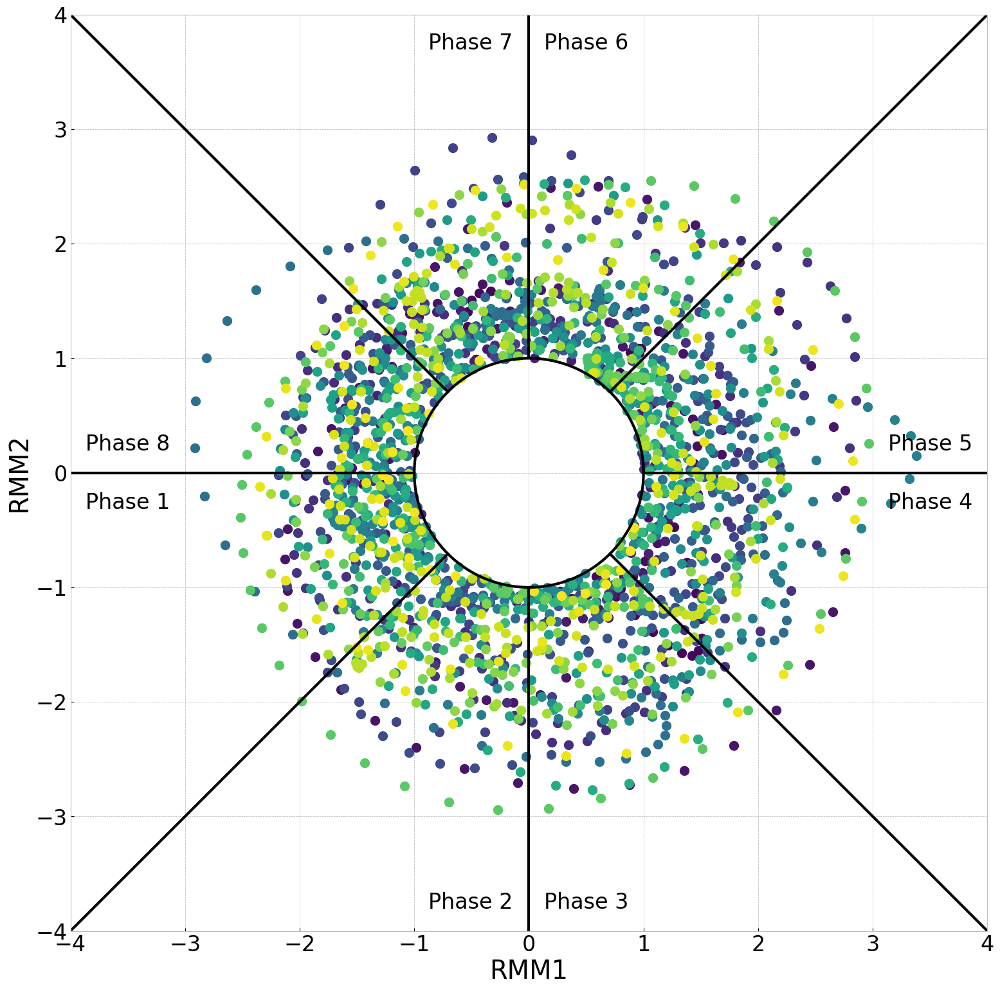

In [15]:
for experiment in experiments_list:
    # Configure plot
    [fig, ax] = plt.subplots(figsize=(16, 16))
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 3
    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)
    plt.xlabel("RMM1")
    plt.ylabel("RMM2")
    ax.set_facecolor("white")

    # Plot index points
    colormap = plt.get_cmap("viridis")  # sns.color_palette("viridis", as_cmap=True)
    start_index = 0
    end_index = len(RMM1.sel(experiment=experiment)) - 1
    # end_index = 300
    ax.plot(RMM1.sel(experiment=experiment)[start_index], RMM2.sel(experiment=experiment)[start_index], color="black", marker=".", ls="-", ms=30)
    for i in range(start_index + 1, end_index + 1):
        ax.plot(
            RMM1.sel(experiment=experiment)[i],
            RMM2.sel(experiment=experiment)[i],
            color=colormap((i - start_index) / (end_index - start_index)),
            marker="o",
            ms=10,
        )

    # Add phase regions overlay
    circle1 = plt.Circle((0, 0), 1.0, color="k", fill=False, lw=3, zorder=10)
    ax.hlines(y=0, xmin=-4, xmax=-1, color="k", lw=3, ls="-")
    ax.hlines(y=0, xmin=1, xmax=4, color="k", lw=3, ls="-")
    ax.vlines(x=0, ymin=-4, ymax=-1, color="k", lw=3, ls="-")
    ax.vlines(x=0, ymin=1, ymax=4, color="k", lw=3, ls="-")
    ax.plot([np.sqrt(2) / 2, 4], [np.sqrt(2) / 2, 4], color="k", lw=3, ls="-")


    x_vals = {1: -1, 2: -1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1, 8: -1}

    val1 = {
        1: 0,
        2: -4,
        3: -4,
        4: 0,
        5: 0,
        6: np.linspace(0, 4, len(RMM1)),
        7: np.linspace(0, 4, len(RMM1)),
        8: 0,
    }

    y_val2 = {
        1: -1 * np.linspace(0, 4, len(RMM1)),
        2: -1 * np.linspace(0, 4, len(RMM1)),
        3: -1 * np.linspace(0, 4, len(RMM1)),
        4: -1 * np.linspace(0, 4, len(RMM1)),
        5: 1 * np.linspace(0, 4, len(RMM1)),
        6: 4,
        7: 4,
        8: 1 * np.linspace(0, 4, len(RMM1)),
    }

    # Fill one of the phases in with blue
    # val=2
    # ax.fill_between(
    #     x_vals[val]*np.linspace(0, 4, len(RMM1)),
    #     y_val1[val],
    #     y_val2[val]
    # )

    # x = np.linspace(-1,1,100)
    # ax.fill_between(x, -np.sqrt(1-x**2), np.sqrt(1-x**2), color='white')

    # Add lines to differentiate the phases
    ax.plot([np.sqrt(2) / 2, 4], [-np.sqrt(2) / 2, -4], color="k", lw=3, ls="-")
    ax.plot([-4, -np.sqrt(2) / 2], [4, np.sqrt(2) / 2], color="k", lw=3, ls="-")
    ax.plot([-4, -np.sqrt(2) / 2], [-4, -np.sqrt(2) / 2], color="k", lw=3, ls="-")
    ax.add_patch(circle1)

    # Add phase labels
    ax.text(
        -3.5, -0.26, f"Phase 1", horizontalalignment="center", verticalalignment="center"
    )
    ax.text(
        -0.51, -3.75, f"Phase 2", horizontalalignment="center", verticalalignment="center"
    )
    ax.text(
        0.5, -3.75, f"Phase 3", horizontalalignment="center", verticalalignment="center"
    )
    ax.text(
        3.5, -0.26, f"Phase 4", horizontalalignment="center", verticalalignment="center"
    )
    ax.text(3.5, 0.25, f"Phase 5", horizontalalignment="center", verticalalignment="center")
    ax.text(0.5, 3.75, f"Phase 6", horizontalalignment="center", verticalalignment="center")
    ax.text(
        -0.51, 3.75, f"Phase 7", horizontalalignment="center", verticalalignment="center"
    )
    ax.text(
        -3.5, 0.25, f"Phase 8", horizontalalignment="center", verticalalignment="center"
    )

    # Add MJO-location labels
    # ax.text(0, 3.5, f'Western Pacific',  horizontalalignment='center',
    #      verticalalignment='center', bbox=props, fontsize=14)

    # ax.text(-3.3, 0, f'Western Hemisphere \n & Africa',  horizontalalignment='center',
    #      verticalalignment='center', bbox=props, fontsize=14)

    # ax.text(3.3, 0, f'Maritime Continent',  horizontalalignment='center',
    #      verticalalignment='center', bbox=props, fontsize=14)

    # ax.text(0, -3.5, f'Indian Ocean',  horizontalalignment='center',
    #      verticalalignment='center', bbox=props, fontsize=14)

    ax.set_aspect("equal")
    plt.tight_layout()

    plt.show()

# plt.savefig(
#     f"{output_directory}/eof-analysis_rmm_plot.png",
#     dpi=300,
#     bbox_inches='tight'
# )

In [66]:
#### Calculate phases
def compute_mjo_phase_indices(RMM1, RMM2):
    phase_times = {}

    # Find times by phase
    phase_times[1] = time.where(
        (RMM1 < 0) & (RMM2 < 0) & (np.abs(RMM1) > np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[2] = time.where(
        (RMM1 < 0) & (RMM2 < 0) & (np.abs(RMM1) < np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[3] = time.where(
        (RMM1 > 0) & (RMM2 < 0) & (np.abs(RMM1) < np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[4] = time.where(
        (RMM1 > 0) & (RMM2 < 0) & (np.abs(RMM1) > np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[5] = time.where(
        (RMM1 > 0) & (RMM2 > 0) & (np.abs(RMM1) > np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[6] = time.where(
        (RMM1 > 0) & (RMM2 > 0) & (np.abs(RMM1) < np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[7] = time.where(
        (RMM1 < 0) & (RMM2 > 0) & (np.abs(RMM1) < np.abs(RMM2))
    ).dropna(dim="time")
    phase_times[8] = time.where(
        (RMM1 < 0) & (RMM2 > 0) & (np.abs(RMM1) > np.abs(RMM2))
    ).dropna(dim="time")

    # Find indices by phase
    phase_indices = {}

    # Find all of the points in phase 1
    phase_indices[1] = np.squeeze(
        np.where((RMM1 < 0) & (RMM2 < 0) & (np.abs(RMM1) > np.abs(RMM2)))
    )

    # Phase 2
    phase_indices[2] = np.squeeze(
        np.where((RMM1 < 0) & (RMM2 < 0) & (np.abs(RMM1) < np.abs(RMM2)))
    )

    # Phase 3
    phase_indices[3] = np.squeeze(
        np.where((RMM1 > 0) & (RMM2 < 0) & (np.abs(RMM1) < np.abs(RMM2)))
    )

    # Phase 4
    phase_indices[4] = np.squeeze(
        np.where((RMM1 > 0) & (RMM2 < 0) & (np.abs(RMM1) > np.abs(RMM2)))
    )

    # Phase 5
    phase_indices[5] = np.squeeze(
        np.where((RMM1 > 0) & (RMM2 > 0) & (np.abs(RMM1) > np.abs(RMM2)))
    )

    # Phase 6
    phase_indices[6] = np.squeeze(
        np.where((RMM1 > 0) & (RMM2 > 0) & (np.abs(RMM1) < np.abs(RMM2)))
    )

    # Phase 7
    phase_indices[7] = np.squeeze(
        np.where((RMM1 < 0) & (RMM2 > 0) & (np.abs(RMM1) < np.abs(RMM2)))
    )

    # Phase 8
    phase_indices[8] = np.squeeze(
        np.where((RMM1 < 0) & (RMM2 > 0) & (np.abs(RMM1) > np.abs(RMM2)))
    )

    return phase_indices, phase_times

In [19]:
phase_times = {}
for phase in np.arange(1,9):
    phase_times[phase] = {}

for experiment in experiments_list:
    phase_times[1][experiment] = time.where(((RMM1 < 0) & (RMM2 < 0) & (np.abs(RMM1) > np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[2][experiment] = time.where(((RMM1 < 0) & (RMM2 < 0) & (np.abs(RMM1) < np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[3][experiment] = time.where(((RMM1 > 0) & (RMM2 < 0) & (np.abs(RMM1) < np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[4][experiment] = time.where(((RMM1 > 0) & (RMM2 < 0) & (np.abs(RMM1) > np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[5][experiment] = time.where(((RMM1 > 0) & (RMM2 > 0) & (np.abs(RMM1) > np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[6][experiment] = time.where(((RMM1 > 0) & (RMM2 > 0) & (np.abs(RMM1) < np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[7][experiment] = time.where(((RMM1 < 0) & (RMM2 > 0) & (np.abs(RMM1) < np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')
    phase_times[8][experiment] = time.where(((RMM1 < 0) & (RMM2 > 0) & (np.abs(RMM1) > np.abs(RMM2)))).sel(experiment=experiment).dropna(dim='time')

# MJO RMM Composites

#### Longitude-Latitude

In [20]:
savefig = False
RMM_pair = '1-2'
# [phase_indices, phase_times] = compute_mjo_phase_indices(
#     (RMM1 if RMM_pair == '1-2' else RMM3),
#     (RMM2 if RMM_pair == '1-2' else RMM4)
# )

variables_to_plot = [
    variables_subset['precipitation'.title()],
    # variables_subset['outgoing longwave radiation'.title()],
    # variables_subset['zonal wind'.title()].sel(plev=200),
    # variables_subset['zonal wind'.title()].sel(plev=850),
    # variables_subset['meridional wind'.title()].sel(plev=850),
    # variables_subset['vertical wind'.title()].sel(plev=500),
    # variables_subset['column temperature'.title()],
    # variables_subset['column water vapor'.title()],
    # variables_subset['geopotential height'.title()].sel(plev=500),
    # variables_subset['moist static energy'.title()].sel(plev=850),
    # variables_subset['column longwave heating'.title()],
    # variables_subset['column shortwave heating'.title()],
    # variables_subset['latent heat flux'.title()],
    # variables_subset['sensible heat flux'.title()],

]


for variable in variables_to_plot:
    print(f"Variable: {variable.name}")
    variable_anomalies = variable - variable.mean(dim=["lat", "lon"])

    variables_by_phase = {}

    for phase in range(1, 9):
        variables_by_phase[phase] = variable_anomalies.sel(time=phase_times[phase]).mean(dim="time")

    plt.style.use("default")
    plt.rcParams.update({"font.size": 24})
    plt.rcParams["figure.dpi"] = 300
    coastline_width = 1
    props = dict(boxstyle="round", facecolor="#eeeeee")

    data_crs = ccrs.PlateCarree()
    proj = ccrs.PlateCarree(central_longitude=-205)

    gs = GridSpec(8, 2, width_ratios=[100, 3])
    gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.15)
    fig = plt.figure(figsize=(16, 30))

    fig.suptitle(
        (
            f"{experiment}"
          + f"{(' ' + (str(variable.plev.values) + '-hPa') if 'plev' in variable.coords else '')}"
          + f" {variable.name} composited over\n {RMM1.attrs['EOF_vars']} RMMs {RMM_pair}-derived MJO-phases"
        ),
        x=0.485,
        y=0.9975
    )

    for phase in range(1, 9):
        # Add an axis object for each phase
        ax = fig.add_subplot(gs[phase - 1, 0])

        ax.set_title(f"Phase {phase:0.0f}")

        # Add the cyclic point
        cdata, clon = cutil.add_cyclic_point(
            variables_by_phase[phase],
            coord=variables_by_phase[phase].lon
        )

        # Plot rainfall by phase
        im = ax.contourf(
            clon,
            variables_by_phase[phase].lat,
            cdata,
            levels=16,
            norm=mcolors.CenteredNorm(vcenter=0),
            **{k: copy.deepcopy(v) for k, v in {
                "cmap": plotting_attributes[variable.name].get("d_cmap")
            }.items() if v is not None}
        )

        # Map parameters
        ax.set_xlabel("")

        ax.set_xlim(0, 360)
        ax.set_ylim(-30, 30)

        xtick_locations = np.arange(0, 360 + 60, 60)
        ytick_locations = np.arange(-30, 40, 10)

        ax.set_xticks(
            ticks=xtick_locations,
            # labels=(tick_labeller(xtick_locations - 180, "lon") if phase == 8 else '')
            labels=tick_labeller(xtick_locations - 180, "lon")
        )
        ax.set_yticks(ticks=ytick_locations, labels=tick_labeller(ytick_locations, "lat"))
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))

        ax.set_aspect("auto")
        ax.grid(True, **grid_kwargs)

    # Set colorbar
    cbar_ax = fig.add_subplot(gs[1:-1, 1])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=20)
    # cbar.set_ticks(np.arange(-4, 24, 4))
    cbar.set_label(variable.attrs['units'])

    if not savefig:
        plt.show()
    else:
        save_string = (
            f"{experiment}"
          + f"_{variable.attrs['file_id']}"
          + f"{((str(variable.plev.values)) if 'plev' in variable.coords else '')}"
          + f"_composited-on-{compositing_variable.attrs['file_id']}"
          + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
          + f"-RMMs-{RMM_pair}.png"
            )
        print(f"Saving plot as {save_string}")
        plt.savefig(
            f"{output_directory}/composites/latitude-longitude/{save_string}",
            dpi=500,
            bbox_inches="tight",
        )

print(f"{'='*40}")
print("Finished")

Variable: Precipitation


ValueError: cannot use a dict-like object for selection on a dimension that does not have a MultiIndex

#### Longitude-Height

Variable: Zonal Wind


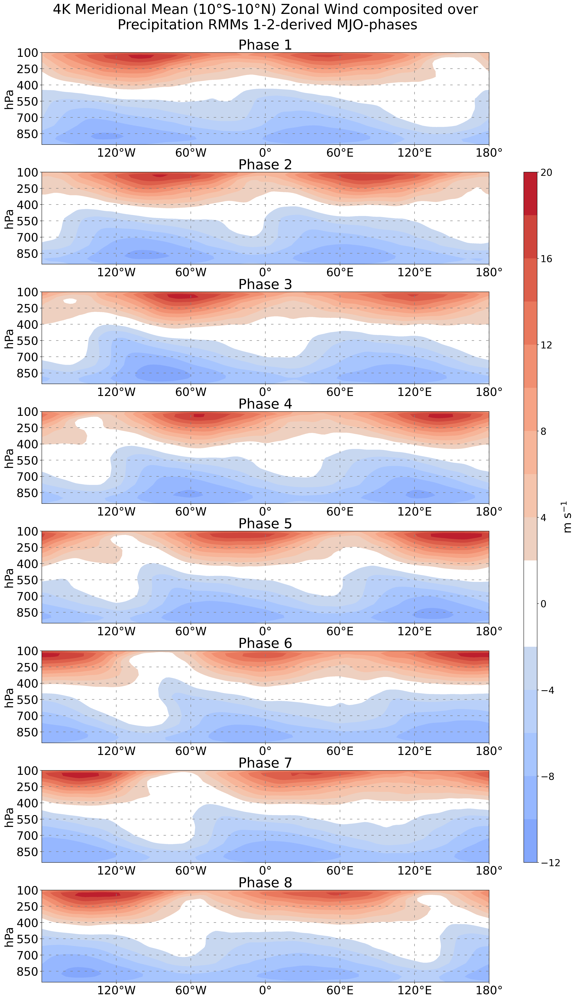

Finished


In [21]:
savefig = False
RMM_pair = '1-2'
# [phase_indices, phase_times] = compute_mjo_phase_indices(
#     (RMM1 if RMM_pair == '1-2' else RMM3),
#     (RMM2 if RMM_pair == '1-2' else RMM4)
# )

weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"
meridional_mean_region = slice(-10, 10)

variables_to_plot = [
    multi_experiment_variables_subset['zonal wind'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['meridional wind'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['vertical wind'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['temperature'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['moisture'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['geopotential height'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['moist static energy'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['longwave heating rate'.title()].sel(experiment='4K'),
    # multi_experiment_variables_subset['shortwave heating rate'.title()].sel(experiment='4K'),
]


for variable in variables_to_plot:
    print(f"Variable: {variable.name}")
    meridonal_mean_variables = variable.sel(lat=meridional_mean_region).weighted(weights).mean(dim="lat")
    variable_anomalies = meridonal_mean_variables - meridonal_mean_variables.mean(dim=["lon", "plev"])

    variables_by_phase = {}

    for phase in range(1, 9):
        variables_by_phase[phase] = variable_anomalies.sel(time=phase_times[phase]['4K']).mean(dim="time")

    plt.style.use("default")
    plt.rcParams.update({"font.size": 24})
    plt.rcParams["figure.dpi"] = 300
    coastline_width = 1
    props = dict(boxstyle="round", facecolor="#eeeeee")

    data_crs = ccrs.PlateCarree()
    proj = ccrs.PlateCarree(central_longitude=-205)

    gs = GridSpec(8, 2, width_ratios=[100, 3])
    gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.15)
    fig = plt.figure(figsize=(16, 30))

    for phase in range(1, 9):
        # Add an axis object for each phase
        ax = fig.add_subplot(gs[phase - 1, 0])

        ax.set_title(f"Phase {phase:0.0f}")

        # Add the cyclic point
        cdata, clon = cutil.add_cyclic_point(
            variables_by_phase[phase].T,
            coord=variables_by_phase[phase].lon
        )

        # Plot rainfall by phase
        im = ax.contourf(
            clon,
            variables_by_phase[phase].plev,
            cdata,
            levels=16,
            norm=mcolors.CenteredNorm(vcenter=0),
            **{k: copy.deepcopy(v) for k, v in {
                "cmap": plotting_attributes[variable.name].get("d_cmap")
            }.items() if v is not None}
        )

        ax.invert_yaxis()
        # Map parameters
        ax.set_xlabel("")
        ax.set_ylabel("hPa")

        ax.set_xlim(0, 360)
        ax.set_ylim(950, 100)

        xtick_locations = np.arange(0, 360 + 60, 60)
        ytick_locations = np.arange(100, 950, 150)

        ax.set_xticks(
            ticks=xtick_locations,
            labels=tick_labeller(xtick_locations - 180, "lon")
        )
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))
        ax.set_yticks(ytick_locations)

        ax.set_aspect("auto")
        ax.grid(True, **grid_kwargs)

    fig.suptitle(
        (
            f"{experiment}"
          + f" Meridional Mean"
          + f" ({tick_labeller([meridional_mean_region.start], 'lat')[0]}"
          + f"-{tick_labeller([meridional_mean_region.stop], 'lat')[0]})"
          + f" {variable.name} composited over\n {RMM1.attrs['EOF_vars']} RMMs {RMM_pair}-derived MJO-phases"
        ),
        x=(ax.get_position().x0+ax.get_position().x1)/2,
        ha='center',
        y=0.9975
    )

    # Set colorbar
    cbar_ax = fig.add_subplot(gs[1:-1, 1])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=20)
    # cbar.set_ticks(np.arange(-4, 24, 4))
    cbar.set_label(variable.attrs['units'])

    if not savefig:
        plt.show()
    else:
        save_string = (
            f"{experiment}"
          + f"_meridional-mean-{tick_labeller([meridional_mean_region.start], 'lat', False)[0]}"
          + f"-{tick_labeller([meridional_mean_region.stop], 'lat', False)[0]}"
          + f"_{variable.attrs['file_id']}"
          + f"_composited-on-{compositing_variable.attrs['file_id']}"
          + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
          + f"-RMMs-{RMM_pair}.png"
            )
        print(f"Saving plot as {save_string}")
        plt.savefig(
            f"{output_directory}/composites/longitude-height/{save_string}",
            dpi=500,
            bbox_inches="tight",
        )

print(f"{'='*40}")
print("Finished")

#### Latitude-Height

Variable: Zonal Wind


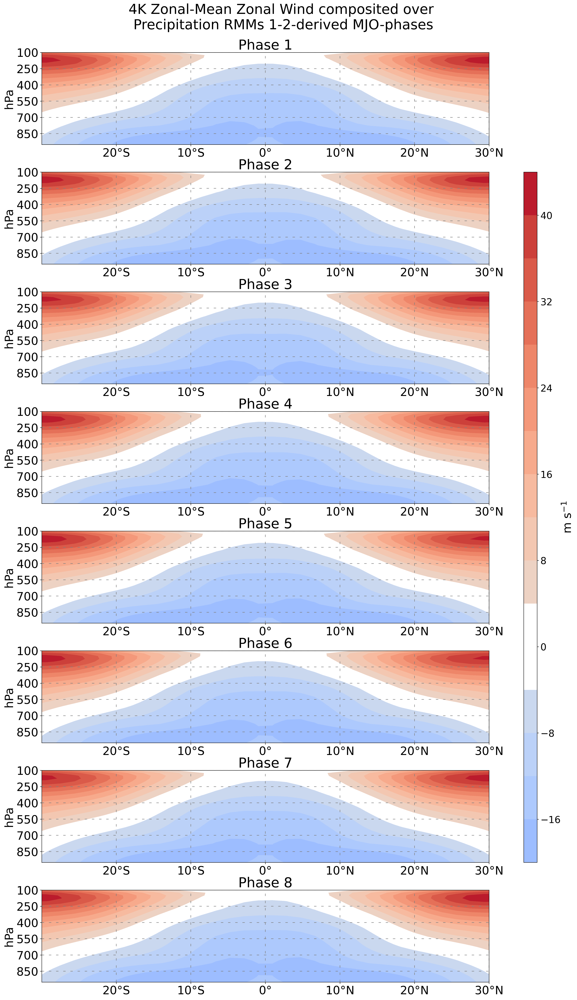

Variable: Meridional Wind


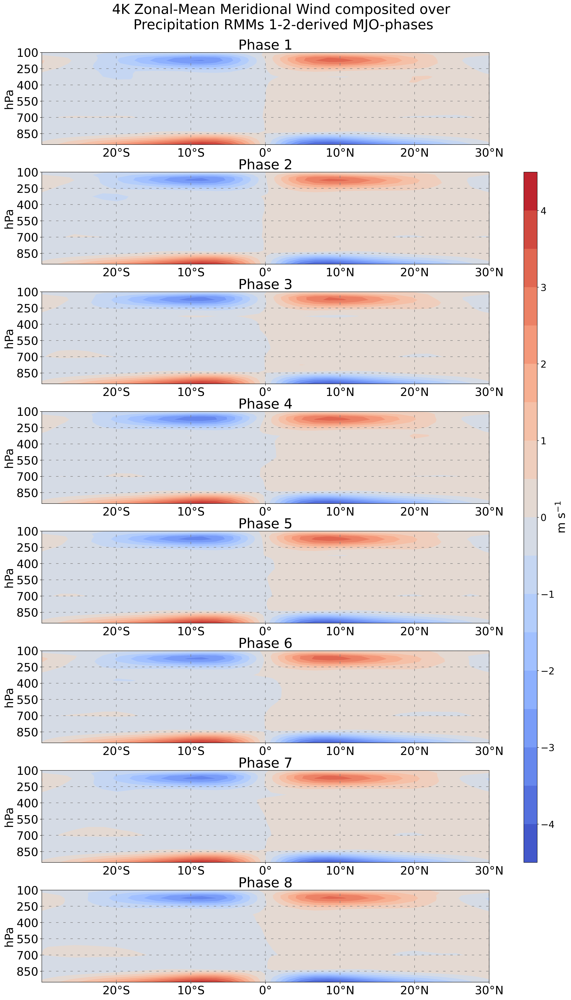

Variable: Vertical Wind


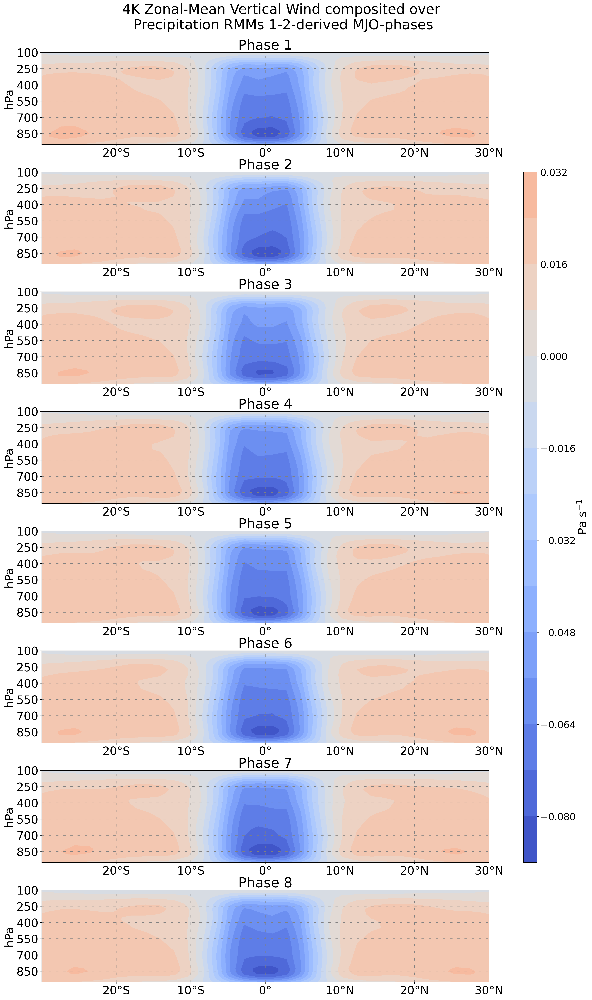

Variable: Temperature


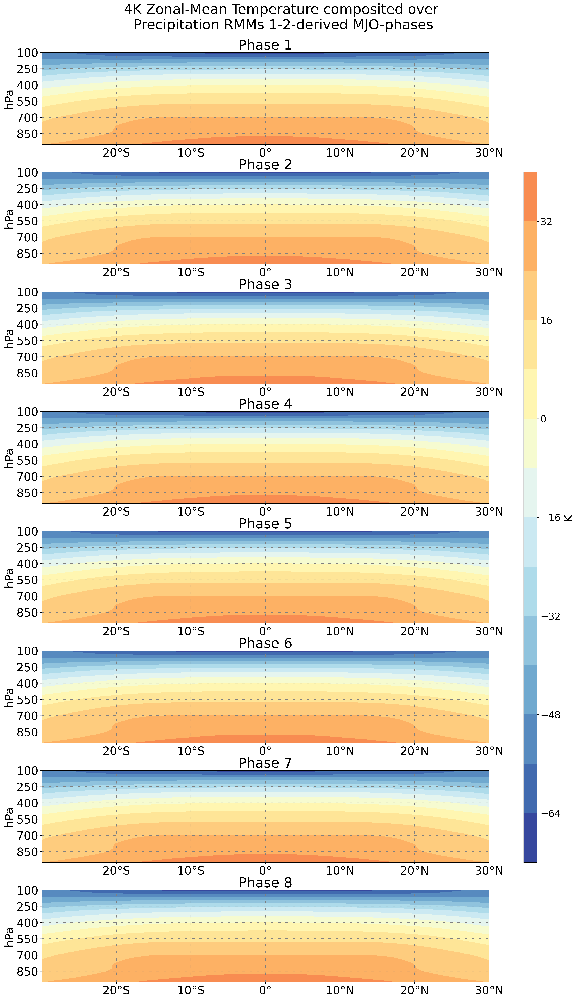

Variable: Moisture


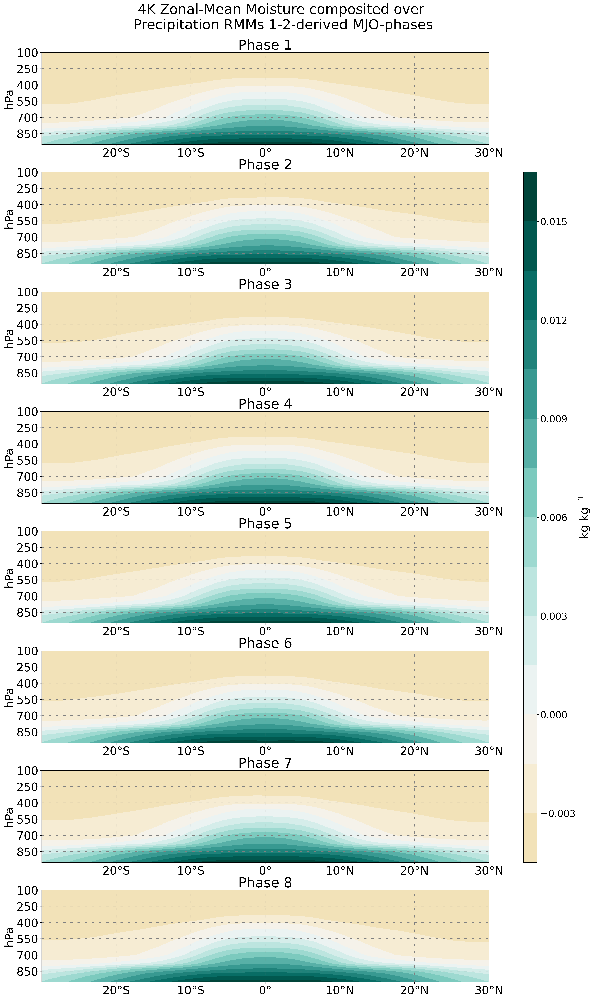

Finished


In [118]:
savefig = False
RMM_pair = '1-2'
# [phase_indices, phase_times] = compute_mjo_phase_indices(
#     (RMM1 if RMM_pair == '1-2' else RMM3),
#     (RMM2 if RMM_pair == '1-2' else RMM4)
# )

meridional_mean_region = slice(-10, 10)
experiment = '4K'

variables_to_plot = [
    multi_experiment_variables_subset['zonal wind'.title()].sel(experiment=experiment),
    multi_experiment_variables_subset['meridional wind'.title()].sel(experiment=experiment),
    multi_experiment_variables_subset['vertical wind'.title()].sel(experiment=experiment),
    multi_experiment_variables_subset['temperature'.title()].sel(experiment=experiment),
    multi_experiment_variables_subset['moisture'.title()].sel(experiment=experiment),
]


for variable in variables_to_plot:
    print(f"Variable: {variable.name}")
    zonal_mean_variables = variable.mean(dim="lon")
    variable_anomalies = zonal_mean_variables - zonal_mean_variables.mean(dim=["lat", "plev"])

    variables_by_phase = {}

    for phase in range(1, 9):
        variables_by_phase[phase] = variable_anomalies.sel(time=phase_times[phase][experiment]).mean(dim="time")

    plt.style.use("default")
    plt.rcParams.update({"font.size": 24})
    plt.rcParams["figure.dpi"] = 300
    coastline_width = 1
    props = dict(boxstyle="round", facecolor="#eeeeee")

    data_crs = ccrs.PlateCarree()
    proj = ccrs.PlateCarree(central_longitude=-205)

    gs = GridSpec(8, 2, width_ratios=[100, 3])
    gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.15)
    fig = plt.figure(figsize=(16, 30))

    fig.suptitle(
        (
            f"{experiment}"
          + f" Zonal-Mean"
          + f" {variable.name} composited over\n {RMM1.attrs['EOF_vars']} RMMs {RMM_pair}-derived MJO-phases"
        ),
        x=0.485,
        y=0.9975
    )

    for phase in range(1, 9):
        # Add an axis object for each phase
        ax = fig.add_subplot(gs[phase - 1, 0])

        ax.set_title(f"Phase {phase:0.0f}")

        # Add the cyclic point
        cdata, clat = cutil.add_cyclic_point(
            variables_by_phase[phase].T,
            coord=variables_by_phase[phase].lat
        )

        # Plot rainfall by phase
        im = ax.contourf(
            clat,
            variables_by_phase[phase].plev,
            cdata,
            levels=16,
            norm=mcolors.CenteredNorm(vcenter=0),
            **{k: copy.deepcopy(v) for k, v in {
                "cmap": plotting_attributes[variable.name].get("d_cmap")
            }.items() if v is not None}
        )

        ax.invert_yaxis()
        # Map parameters
        ax.set_xlabel("")
        ax.set_ylabel("hPa")

        ax.set_xlim(-30, 30)
        ax.set_ylim(950, 100)

        xtick_locations = np.arange(-30, 30+10, 10)
        ytick_locations = np.arange(100, 950, 150)

        ax.set_xticks(
            ticks=xtick_locations,
            labels=tick_labeller(xtick_locations, "lat")
        )
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))
        ax.set_yticks(ytick_locations)

        ax.set_aspect("auto")
        ax.grid(True, **grid_kwargs)

    # Set colorbar
    cbar_ax = fig.add_subplot(gs[1:-1, 1])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=20)
    # cbar.set_ticks(np.arange(-4, 24, 4))
    cbar.set_label(variable.attrs['units'])

    if not savefig:
        plt.show()
    else:
        save_string = (
            f"{experiment}"
          + f"_zonal-mean"
          + f"_{variable.attrs['file_id']}"
          + f"_composited-on-{compositing_variable.attrs['file_id']}"
          + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
          + f"-RMMs-{RMM_pair}.png"
            )
        print(f"Saving plot as {save_string}")
        plt.savefig(
            f"{output_directory}/composites/latitude-height/{save_string}",
            dpi=500,
            bbox_inches="tight",
        )

print(f"{'='*40}")
print("Finished")

#### OLR, U850, V850

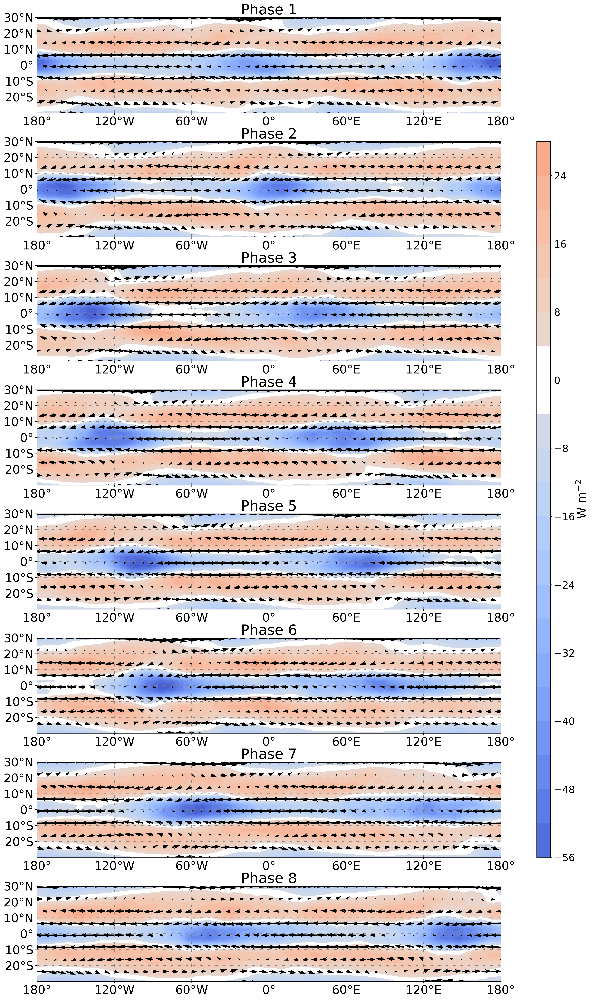

In [324]:
[phase_indices, phase_times] = compute_mjo_phase_indices(RMM1, RMM2)

variables_to_plot = [
    variables_subset['outgoing longwave radiation'],
    variables_subset['zonal wind'].sel(plev=850),
    variables_subset['meridional wind'].sel(plev=850),
]

variable_anomalies = {}
variables_by_phase = {}

for variable in variables_to_plot:
    variable_anomalies[variable.name] = variable - variable.mean(dim=["lat", "lon"])

    variables_by_phase[variable.name] = {}
    for phase in range(1, 9):
        variables_by_phase[variable.name][phase] = (
            variable_anomalies[variable.name].sel(time=phase_times[phase]).mean(dim="time")
        )


plt.style.use("default")
plt.rcParams.update({"font.size": 24})
plt.rcParams["figure.dpi"] = 300
coastline_width = 1
props = dict(boxstyle="round", facecolor="#eeeeee")

data_crs = ccrs.PlateCarree()
proj = ccrs.PlateCarree(central_longitude=-205)

gs = GridSpec(8, 2, width_ratios=[100, 3])
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.15)
fig = plt.figure(figsize=(16, 30))

# cmap_modified = modified_colormap('RdYlBu_r', 'white', 0.05, 0.05)
cmap_modified = mjo.modified_colormap("coolwarm", "white", 0.05, 0.05)

keyword_args = {
    # 'transform':data_crs,
    "cmap": cmap_modified,
    # "levels": np.linspace(-55, 25, 21),
    'levels': 21,
    "norm": mcolors.CenteredNorm(vcenter=0),
    # 'extend': 'both'
}

for phase in range(1, 9):
    # Add an axis object for each phase
    # ax = fig.add_subplot(gs[phase-1, 0], projection=proj)
    ax = fig.add_subplot(gs[phase - 1, 0])

    ax.set_title(f"Phase {phase:0.0f}")

    # Add the cyclic point
    cdata, clon = cutil.add_cyclic_point(
        variables_by_phase["Outgoing Longwave Radiation"][phase],
        coord=variables_by_phase["Outgoing Longwave Radiation"][phase].lon,
    )

    # Plot rainfall by phase
    im = ax.contourf(
        clon,
        variables_by_phase["Outgoing Longwave Radiation"][phase].lat,
        cdata,
        **keyword_args,
    )

    cdata_u, clon_u = cutil.add_cyclic_point(
        variables_by_phase["Zonal Wind"][phase],
        coord=variables_by_phase["Zonal Wind"][phase].lon,
    )

    cdata_v, clon_v = cutil.add_cyclic_point(
        variables_by_phase["Meridional Wind"][phase],
        coord=variables_by_phase["Meridional Wind"][phase].lon,
    )

    quiver_lon_skip = 3
    quiver_lat_skip = 4
    q = ax.quiver(
        clon_u[::quiver_lon_skip],
        variables_by_phase["Zonal Wind"][phase].lat[::quiver_lat_skip],
        cdata_u[::quiver_lat_skip, ::quiver_lon_skip],
        cdata_v[::quiver_lat_skip, ::quiver_lon_skip],
    )

    # Map parameters
    ax.set_xlabel("")

    ax.set_xlim(0, 360)
    ax.set_ylim(-30, 30)

    xtick_locations = np.arange(0, 360 + 60, 60)
    ytick_locations = np.arange(-30, 40, 10)

    ax.set_xticks(
        ticks=xtick_locations, labels=tick_labeller(xtick_locations - 180, "lon")
    )
    ax.set_yticks(ticks=ytick_locations, labels=tick_labeller(ytick_locations, "lat"))
    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))

    ax.set_aspect("auto")
    ax.grid(True, lw=1, ls=(0, (5, 10)), color="gray")

# Set colorbar
cbar_ax = fig.add_subplot(gs[1:-1, 1])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.ax.tick_params(labelsize=20)
cbar.set_ticks(im.levels[::2])
cbar.set_label(r"W m$^{-2}$")

plt.show()

# Lag Composites

## Lag-Height

In [438]:
print("Compositing over chosen events")
print(f"{'='*str_width}")

variables_to_plot = [
    multi_experiment_variables_filtered['precipitation'.title()],
    multi_experiment_variables_filtered['zonal wind'.title()],
    multi_experiment_variables_filtered['meridional wind'.title()],
    multi_experiment_variables_filtered['vertical wind'.title()],
    multi_experiment_variables_filtered['temperature'.title()],
    multi_experiment_variables_filtered['moisture'.title()],
    multi_experiment_variables_filtered['geopotential height'.title()],
    multi_experiment_variables_filtered['moist static energy'.title()],
    multi_experiment_variables_filtered['longwave heating rate'.title()],
    multi_experiment_variables_filtered['shortwave heating rate'.title()],
]


variables_composited = {}
composite_days = np.arange(-15, 16)

meridional_mean_reference_precip = multi_experiment_variables_filtered['Precipitation'].sel(
    lon=reference_lon,
    lat=meridional_mean_region
).weighted(weights).mean(dim='lat').isel(time=slice(15, len(time)-15))

precip_std = meridional_mean_reference_precip.std(dim='time')
precipitation_peaks = meridional_mean_reference_precip.where(meridional_mean_reference_precip >= precip_std).dropna(dim='time')

precipitation_peaks = precipitation_peaks.drop_sel(
        time=[
            cftime.DatetimeNoLeap(7, 2, 16, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 17, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 18, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 19, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 19, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 20, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 21, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 22, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 23, 0, 0, 0, 0, has_year_zero=True),
            cftime.DatetimeNoLeap(7, 2, 24, 0, 0, 0, 0, has_year_zero=True)
        ]
    )

for index, variable in enumerate(variables_to_plot):
# for index, variable in enumerate([variables_filtered['precipitation'.title()]]):
    print(f"{f'({index+1}/{len(variables_to_plot)}) {variable.name}...':<{str_width-1}}", end="")
    meridional_mean_reference_variable = variables_filtered[variable.name].sel(
                lon=reference_lon,
                lat=meridional_mean_region
            ).weighted(weights).mean(dim='lat')

    if 'plev' in variable.coords:
        variables_composited[variable.name] = xr.DataArray(
            data = np.empty((len(composite_days), len(pressure_levels))),
            dims=["day", "plev"],
            coords = dict(
                day=composite_days,
                plev=pressure_levels
            ),
            attrs=variables_filtered[variable.name].attrs,
            name=variable.name
        )
    else:
        variables_composited[variable.name] = xr.DataArray(
            data = np.empty((len(composite_days))),
            dims=["day"],
            coords = dict(
                day=composite_days,
            ),
            attrs=variables_filtered[variable.name].attrs,
            name=variable.name
        )

    for day_index, composite_day in enumerate(composite_days):
        variables_composited[variable.name][day_index] = np.average(
            [
                meridional_mean_reference_variable.sel(time=(peak_day + timedelta(days=int(composite_day))).values)
                for peak_day in precipitation_peaks.time
            ],
            axis=0
        )

    print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

Compositing over chosen events
(1/10) Precipitation...                ✔
(2/10) Zonal Wind...                   ✔
(3/10) Meridional Wind...              ✔
(4/10) Vertical Wind...                ✔
(5/10) Temperature...                  ✔
(6/10) Moisture...                     ✔
(7/10) Geopotential Height...          ✔
(8/10) Moist Static Energy...          ✔
(9/10) Longwave Heating Rate...        ✔
(10/10) Shortwave Heating Rate...      ✔
Finished


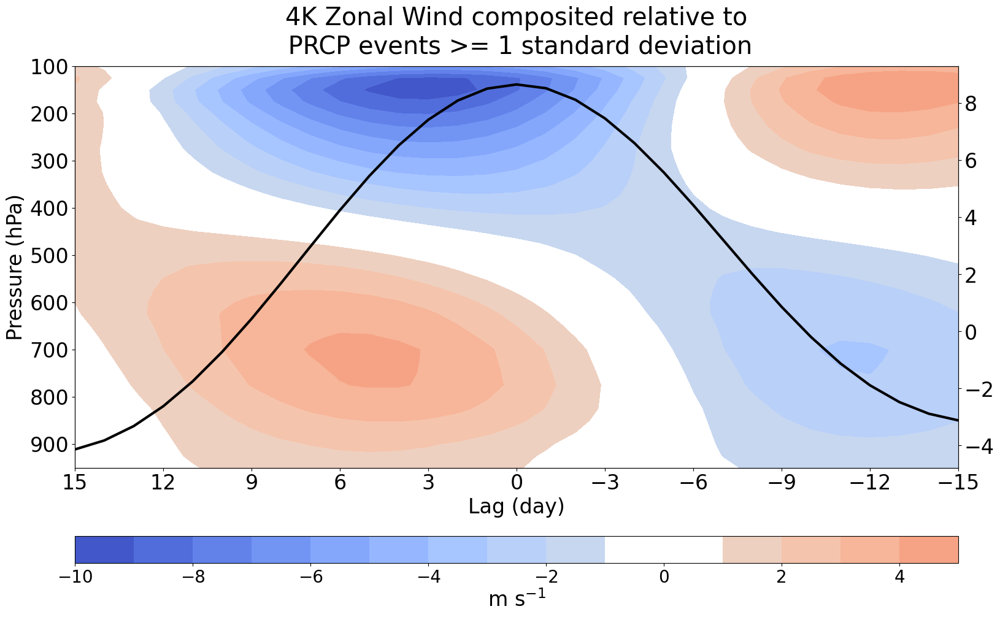

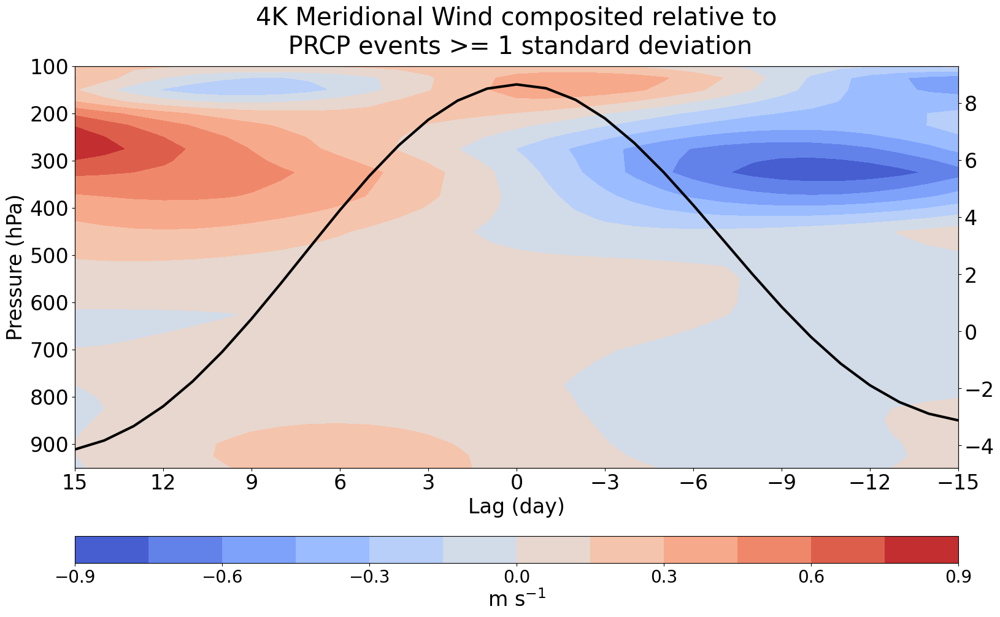

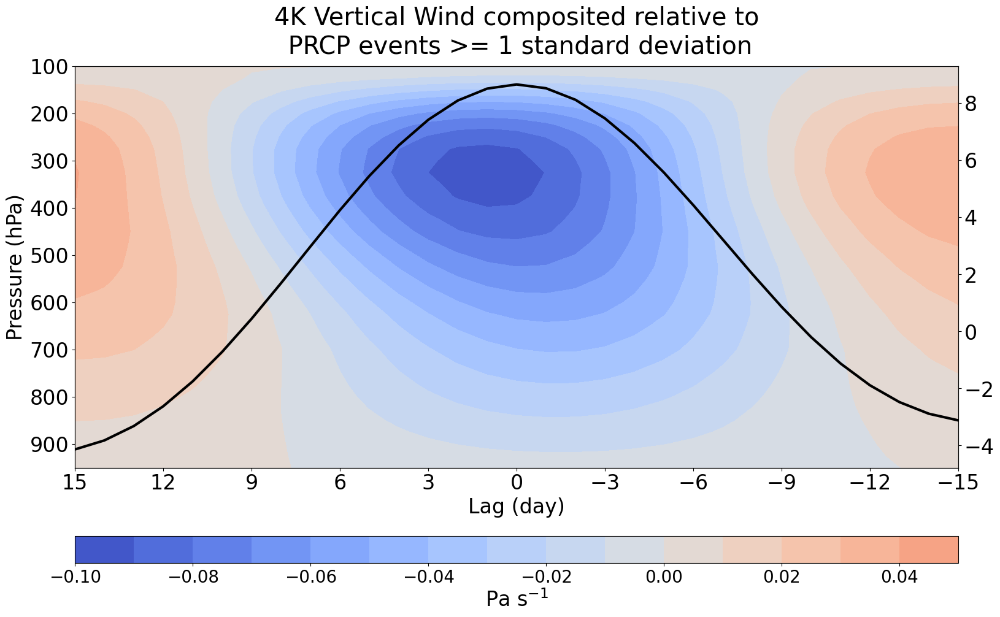

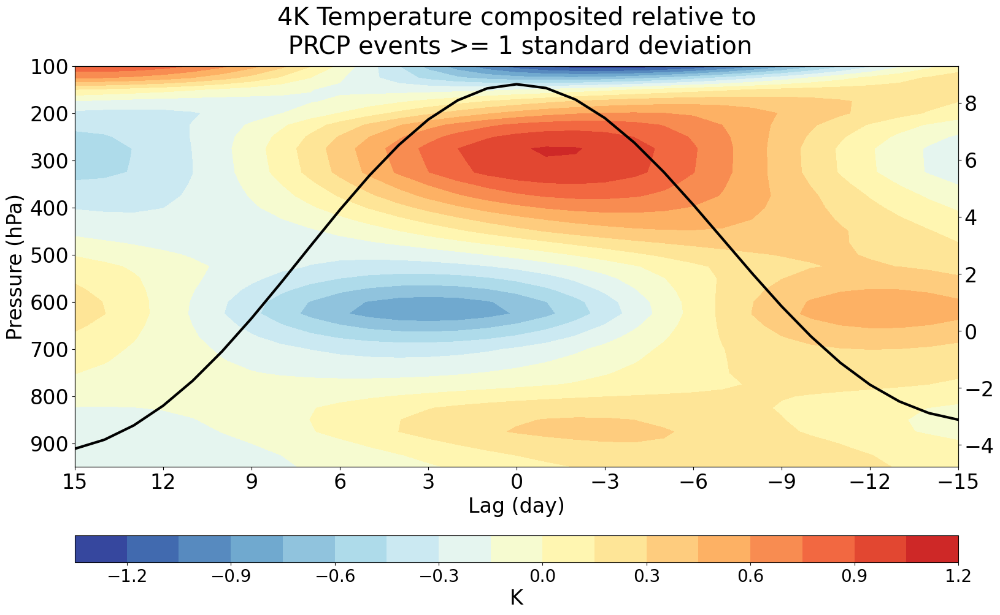

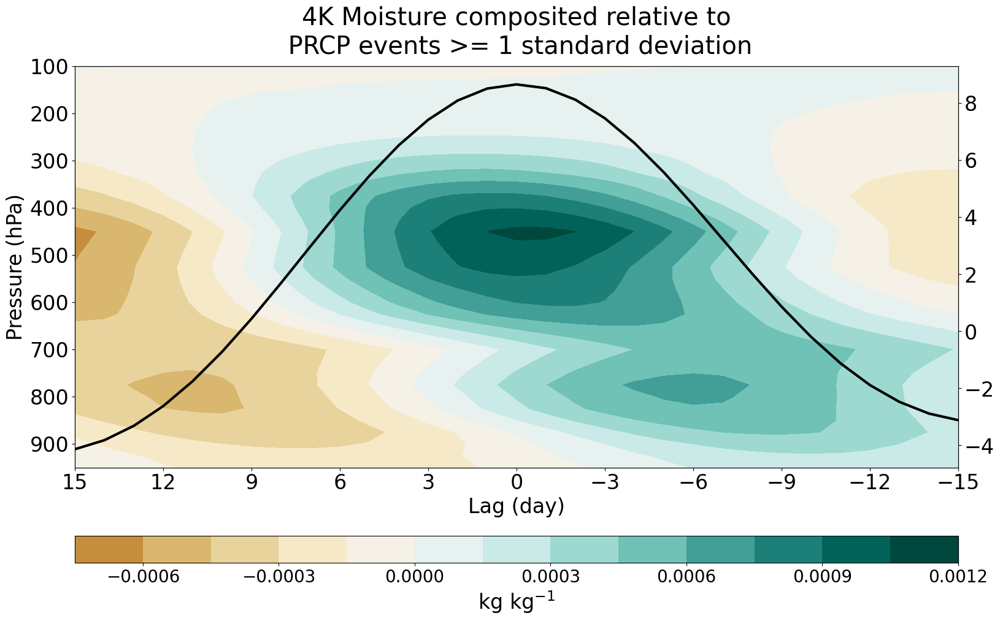

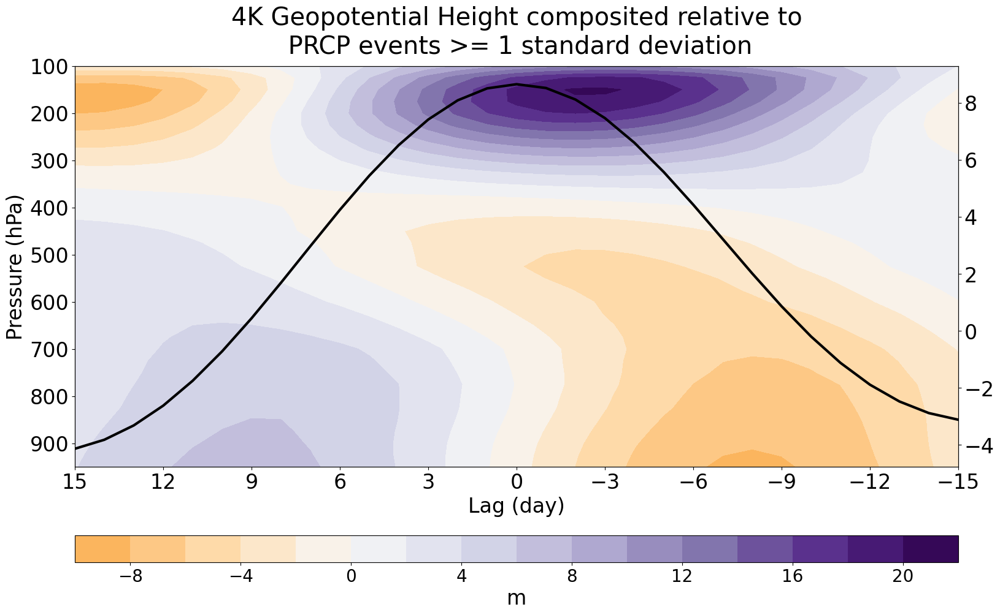

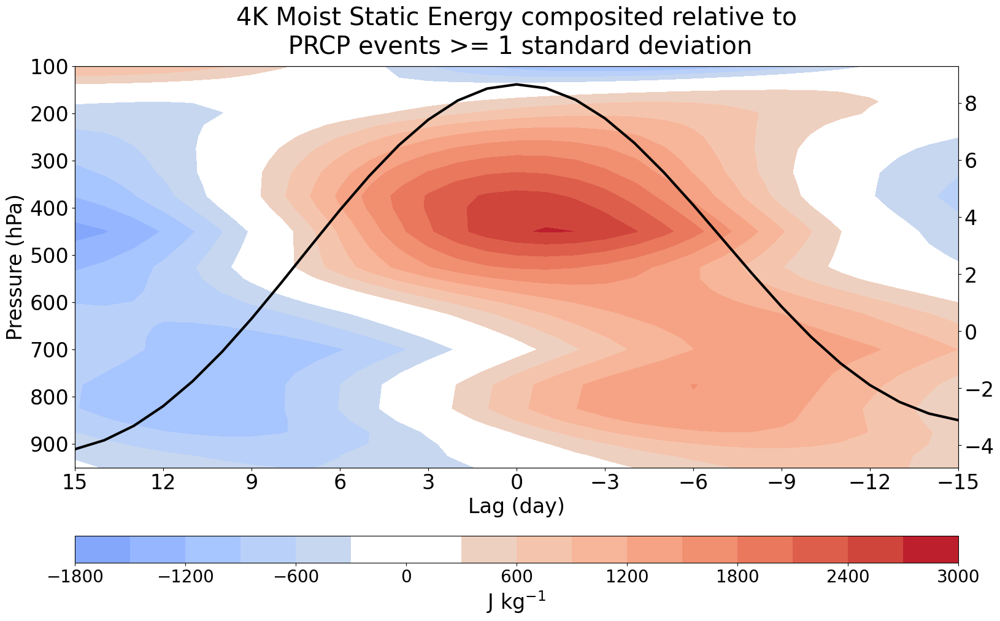

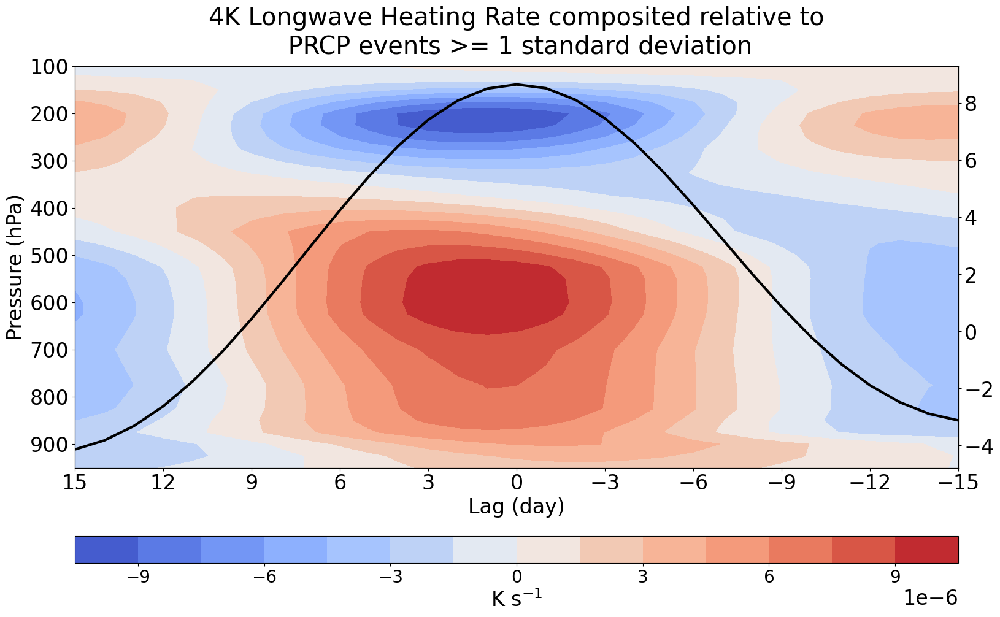

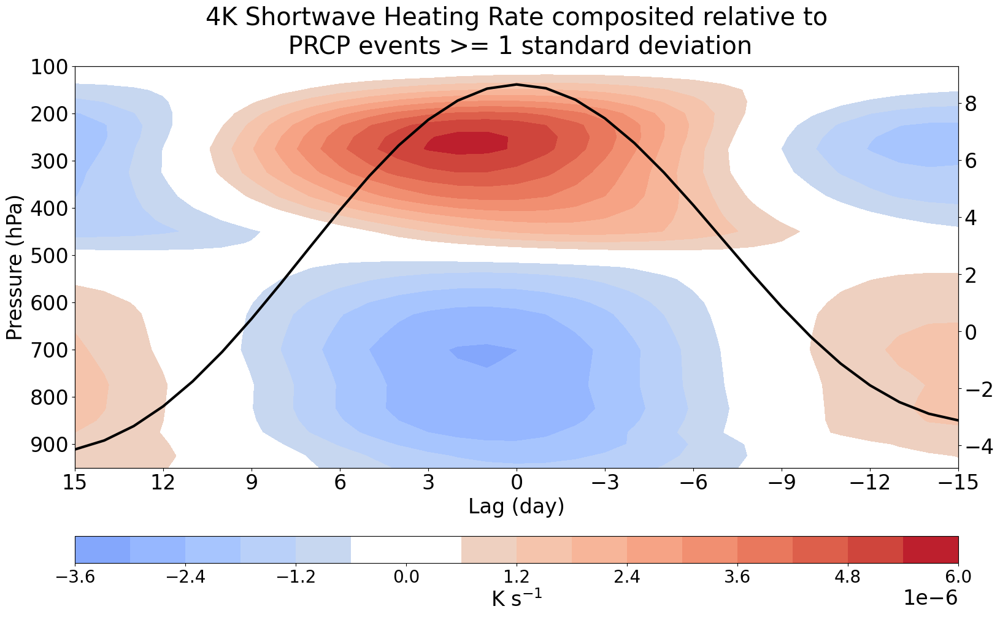

Finished


In [441]:
for variable in variables_composited.values():
    plt.style.use("default")
    plt.rcParams.update({"font.size": 24})

    if variable.name != 'Precipitation':
        fig = plt.figure(figsize=(16, 9))
        gs = GridSpec(2, 1, height_ratios=[30, 2], figure=fig)
        gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.32, wspace=0.0)

        ax = fig.add_subplot(gs[0])
        cb_ax = fig.add_subplot(gs[1])

        ax.set_title(
            f"{experiment} {variable.name} composited relative to\n PRCP events >= 1 standard deviation",
            pad=15
        )
        # Plot data

        im = ax.contourf(
            variable.day,
            variable.plev,
            variable.T,
            levels=16,
            norm=mcolors.CenteredNorm(vcenter=0),
            **{k: copy.deepcopy(v) for k, v in {
                "cmap": plotting_attributes[variable.name].get("d_cmap")
            }.items() if v is not None}
        )

        # Add colorbar
        cbar = fig.colorbar(
            im,
            cax=cb_ax,
            label=variable.attrs['units'],
            orientation="horizontal",
        )
        cbar.ax.tick_params(labelsize=20)

    ax2 = ax.twinx()
    ax2.plot(
        variables_composited['Precipitation'].day,
        variables_composited['Precipitation'],
        color='k',
        lw=3
    )

    # Axis parameters
    ax.set_xlim(-15, 15)
    x_ticks = np.arange(-15, 15+3, 3)
    ax.set_xticks(x_ticks)
    # ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    ax.set_xlabel("Lag (day)")
    ax.invert_xaxis()

    # ax.set_yscale('log')
    ax.set_ylim(100, 950)
    ax.set_yticks(np.arange(100, 1000, 100))
    ax.set_ylabel("Pressure (hPa)")
    ax.invert_yaxis()

    plt.show()
print("Finished")